<a name="top" id="top"></a>

<div align="center">
    <h1>Benchmarking</h1>
    <a href="https://github.com/bernalde">David E. Bernal Neira</a>
    <br>
    <i>Davidson School of Chemical Engineering, Purdue University</i>
    <br>
    <br>
    <a href="https://github.com/pedromxavier">Pedro Maciel Xavier</a>
    <br>
    <i>Elmore Family School of Electrical and Computer Engineering, Purdue University</i>
    <br>
    <br>
    <a href="https://github.com/jvpcms">João Victor Souza</a>
    <br>
    <i>Computer Engineering Department, Military Institute of Engineering (IME)</i>
    <br>
    <br>
    <a href="https://colab.research.google.com/github/JuliaQUBO/QUBONotebooks/blob/main/notebooks_jl/5-Benchmarking.ipynb" target="_parent">
        <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
    </a>
    <a href="https://secquoia.github.io/">
        <img src="https://img.shields.io/badge/🌲⚛️🌐-SECQUOIA-blue" alt="SECQUOIA"/>
    </a>
</div>

### Activate Environment

In [2]:
import Pkg; Pkg.activate(@__DIR__) # Here we go!
__precompile__(false)

  Activating project at `~/purdue-internship/QUBONotebooksFork/notebooks_jl`


## About this Notebook

With the new availability of unconventional hardware, novel algorithms, and increasingly optimized software to address optimization problems; the first question that arises is, which one is better?
We will call the combination of hardware, algorithm, and software within a solution method as a solver.
This question is also relevant when evaluating a single solver, given that usually they rely on hyperparameters, for which the quesiton now becomes into, which is the best parameter setting for a given solver?
These questions obviously depend on the problem that one is trying to solve. The solution of the problem also depends on the budget of resources that one has available.

In the case that the available resources are relatively "unlimited" and that the problem to solve is known, one could exhaustively try all the parameter settings within a delimited range for that instance and choose which one is the best.
This case is idealistic, in the sense that usually one does not know a-priori which problem is there to solve (and if while testing all the parameters you solve it, what would be the point of identifying the best parameters?), and that there exists limitations in terms of resources, e.g., time, memory, or energy, when trying to address these problems.
A case closer to reality is where you have the chance of solving problems that look similar to the one that you are interested in solving later, either because you have previously generated problems or you have identified a feature that characterizes your problem of interest and can generate random instances, which we will call as a family of instances.
Then, you can use a larger amount of resources to solve that family of problems "off-line", meaning that you spend extra resources to address the problems in your family of instances although it is unrelated to the actual application.
Finally, you would like to use the results that you found off-line as a guidance to solve your unknown problem more efficiently.

## Example
For illustration purposes, we will use an example that you are already familiar with, which is an Ising model.
As a solver, we will use the **[DWave SA](https://github.com/JuliaQUBO/DWave.jl)** simulated annealing code.

## Ising model
This notebook will explain the basics of the Ising model.
In order to implement the different Ising Models we will use **[JuMP](https://jump.dev)** and **[QUBO.jl](https://github.com/psrenergy/QUBO.jl)**, for defining the Ising model and solving it with simulated annealing.

### Problem statement

We pose the Ising problem as the following optimization problem:

$$
\min_{s \in \{ \pm 1 \}^n} H(s) = \min_{s \in \{ \pm 1 \}^n} \sum_{(i, j) \in E(G)} J_{i,j}s_is_j + \sum_{i \in V(G)} h_is_i + \beta
$$

where we optimize over spins $s \in \{ \pm 1 \}^n$, on a constrained graph $G(V,E)$, where the quadratic coefficients are $J_{i,j}$ and the linear coefficients are $h_i$.
We also include an arbitrary offset of the Ising model $\beta$.

### Example 1

Suppose we have an Ising model defined from

$$
h = \begin{bmatrix}
145.0 \\ 122.0 \\ 122.0 \\ 266.0 \\ 266.0 \\ 266.0 \\ 242.5 \\ 266.0 \\ 386.5 \\ 387.0 \\ 386.5
\end{bmatrix},
J = \begin{bmatrix}
0 & 0 & 0 & 24 & 24 & 24 & 24 & 24 & 24 & 24 & 24\\
0 & 0 & 0 & 24 & 0 & 24 & 24 & 24 & 24 & 24 & 24\\
0 & 0 & 0 & 0 & 24 & 0 & 24 & 24 & 24 & 24 & 24\\
0 & 0 & 0 & 0 & 24 & 48 & 24 & 24 & 48 & 48 & 48\\
0 & 0 & 0 & 0 & 0 & 24 & 24 & 48 & 48 & 48 & 48\\
0 & 0 & 0 & 0 & 0 & 0 & 24 & 24 & 48 & 48 & 48\\
0 & 0 & 0 & 0 & 0 & 0 & 0 & 24 & 48 & 48 & 48\\
0 & 0 & 0 & 0 & 0 & 0 & 0 & 0 & 48 & 48 & 48\\
0 & 0 & 0 & 0 & 0 & 0 & 0 & 0 & 0 & 72 & 72\\
0 & 0 & 0 & 0 & 0 & 0 & 0 & 0 & 0 & 0 & 72\\
0 & 0 & 0 & 0 & 0 & 0 & 0 & 0 & 0 & 0 & 0\\
\end{bmatrix} \text{ and }
\beta = 1319.5
$$

In [3]:
using LinearAlgebra
using JuMP
using QUBO

[ Info: Precompiling JuMP [4076af6c-e467-56ae-b986-b466b2749572] (cache misses: wrong source (2), incompatible header (10))

SYSTEM: caught exception of type :MethodError while trying to print a failed Task notice; giving up
[ Info: Precompiling QUBO [ce8c2e91-a970-4681-856b-16178c24a30c] (cache misses: incompatible header (4))

SYSTEM: caught exception of type :MethodError while trying to print a failed Task notice; giving up

SYSTEM: caught exception of type :MethodError while trying to print a failed Task notice; giving up

SYSTEM: caught exception of type :MethodError while trying to print a failed Task notice; giving up

SYSTEM: caught exception of type :MethodError while trying to print a failed Task notice; giving up

SYSTEM: caught exception of type :MethodError while trying to print a failed Task notice; giving up

SYSTEM: caught exception of type :MethodError while trying to print a failed Task notice; giving up

SYSTEM: caught exception of type :MethodError while trying to p

In [4]:
h = [
    145.0,
    122.0,
    122.0,
    266.0,
    266.0,
    266.0,
    242.5,
    266.0,
    386.5,
    387.0,
    386.5,
]

J = [
    0  0  0 24 24 24  0 24 24 24 24
    0  0  0 24  0 24 24  0 24 24 24
    0  0  0  0 24  0 24 24 24 24 24
    0  0  0  0 24 48 24 24 48 48 48
    0  0  0  0  0 24 24 48 48 48 48
    0  0  0  0  0  0 24 24 48 48 48
    0  0  0  0  0  0  0 24 48 48 48
    0  0  0  0  0  0  0  0 48 48 48
    0  0  0  0  0  0  0  0  0 72 72
    0  0  0  0  0  0  0  0  0  0 72
    0  0  0  0  0  0  0  0  0  0  0
]

β = 1319.5

ising_model = Model()

@variable(ising_model, s[1:11], Spin)

@objective(ising_model, Min, s' * J * s + h' * s + β)

println(ising_model)

Min 24 s[4]*s[1] + 24 s[4]*s[2] + 24 s[5]*s[1] + 24 s[5]*s[3] + 24 s[5]*s[4] + 24 s[6]*s[1] + 24 s[6]*s[2] + 48 s[6]*s[4] + 24 s[6]*s[5] + 24 s[7]*s[2] + 24 s[7]*s[3] + 24 s[7]*s[4] + 24 s[7]*s[5] + 24 s[7]*s[6] + 24 s[8]*s[1] + 24 s[8]*s[3] + 24 s[8]*s[4] + 48 s[8]*s[5] + 24 s[8]*s[6] + 24 s[8]*s[7] + 24 s[9]*s[1] + 24 s[9]*s[2] + 24 s[9]*s[3] + 48 s[9]*s[4] + 48 s[9]*s[5] + 48 s[9]*s[6] + 48 s[9]*s[7] + 48 s[9]*s[8] + 24 s[10]*s[1] + 24 s[10]*s[2] + 24 s[10]*s[3] + 48 s[10]*s[4] + 48 s[10]*s[5] + 48 s[10]*s[6] + 48 s[10]*s[7] + 48 s[10]*s[8] + 72 s[10]*s[9] + 24 s[11]*s[1] + 24 s[11]*s[2] + 24 s[11]*s[3] + 48 s[11]*s[4] + 48 s[11]*s[5] + 48 s[11]*s[6] + 48 s[11]*s[7] + 48 s[11]*s[8] + 72 s[11]*s[9] + 72 s[11]*s[10] + 145 s[1] + 122 s[2] + 122 s[3] + 266 s[4] + 266 s[5] + 266 s[6] + 242.5 s[7] + 266 s[8] + 386.5 s[9] + 387 s[10] + 386.5 s[11] + 1319.5
Subject to
 s[1] spin
 s[2] spin
 s[3] spin
 s[4] spin
 s[5] spin
 s[6] spin
 s[7] spin
 s[8] spin
 s[9] spin
 s[10] spin
 s[11] spin



We can visualize the graph that defines this instance using the $\mathbf{J}$ matrix as the adjacency matrix of a graph.

In [5]:
using Plots

[ Info: Precompiling Plots [91a5bcdd-55d7-5caf-9e0b-520d859cae80] (cache misses: incompatible header (10), dep missing source (2))

SYSTEM: caught exception of type :MethodError while trying to print a failed Task notice; giving up

SYSTEM: caught exception of type :MethodError while trying to print a failed Task notice; giving up

SYSTEM: caught exception of type :MethodError while trying to print a failed Task notice; giving up

SYSTEM: caught exception of type :MethodError while trying to print a failed Task notice; giving up

SYSTEM: caught exception of type :MethodError while trying to print a failed Task notice; giving up

SYSTEM: caught exception of type :MethodError while trying to print a failed Task notice; giving up

SYSTEM: caught exception of type :MethodError while trying to print a failed Task notice; giving up

SYSTEM: caught exception of type :MethodError while trying to print a failed Task notice; giving up

SYSTEM: caught exception of type :MethodError while trying t

In [6]:
# Make plots look professional
Plots.default(;
    fontfamily = "Computer Modern",
    plot_titlefontsize  = 16,
    titlefontsize       = 14,
    guidefontsize       = 12,
    legendfontsize      = 10,
    tickfontsize        = 10,
)

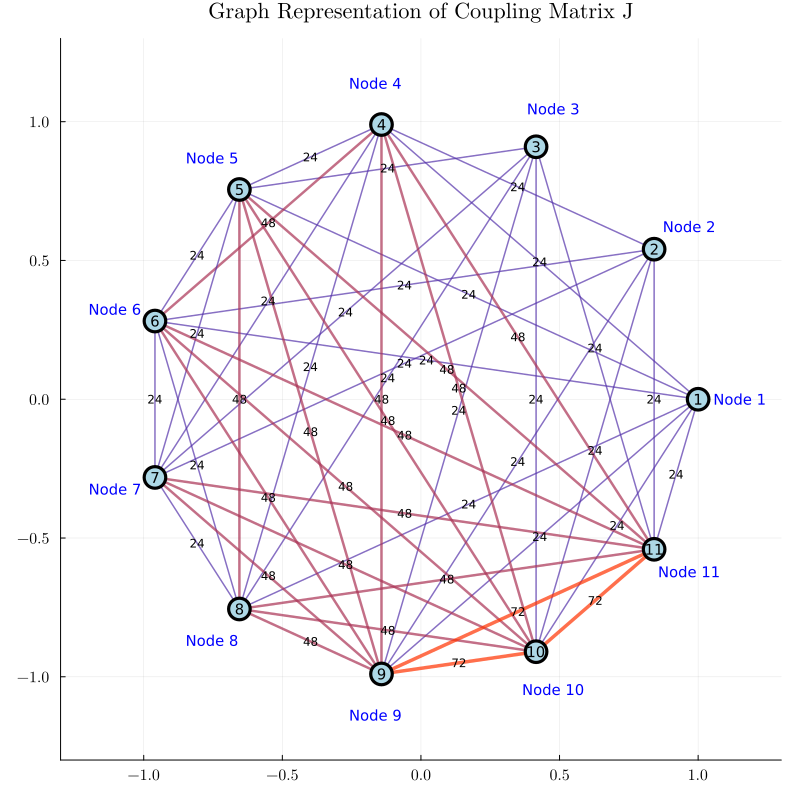

In [7]:
# plot(QUBOTools.backend(unsafe_backend(ising_model)))
n_nodes = size(J, 1)
θ = range(0, 2π, length = n_nodes + 1)[1:end-1]  # angles for circular layout
node_x = cos.(θ)
node_y = sin.(θ)

# Create the plot
p = plot(size = (800, 800), aspect_ratio = :equal, legend = false)

# Plot edges with weights as line widths
max_weight = maximum(J)
for i in 1:n_nodes, j in (i+1):n_nodes
    if J[i, j] != 0
        # Edge width proportional to weight (scaled for visibility)
        linewidth = 0.5 + 3 * (J[i, j] / max_weight)
        
        # Color based on weight
        color_val = J[i, j] / max_weight
        edge_color = RGB(color_val, 0.2, 1 - color_val)
        
        # Plot the edge
        plot!([node_x[i], node_x[j]], [node_y[i], node_y[j]], 
              linewidth = linewidth, color = edge_color, alpha = 0.7)
        
        # Add weight label at midpoint
        mid_x = (node_x[i] + node_x[j]) / 2
        mid_y = (node_y[i] + node_y[j]) / 2
        annotate!(mid_x, mid_y, text("$(J[i,j])", 8, :black, :center))
    end
end

# Plot nodes
scatter!(node_x, node_y, 
         markersize = 12, 
         markercolor = :lightblue,
         markerstrokewidth = 2,
         markerstrokecolor = :black,
         series_annotations = text.(1:n_nodes, :black, :center, 10))

# Add node labels
for i in 1:n_nodes
    annotate!(node_x[i] * 1.15, node_y[i] * 1.15, text("Node $i", 10, :blue, :center))
end

# Customize the plot
title!("Graph Representation of Coupling Matrix J")
xlabel!("")
ylabel!("")
xlims!(-1.3, 1.3)
ylims!(-1.3, 1.3)

# Display the plot
p

Since the problem is relatively small (11 variables, $2^{11} = 2048$ combinations), we can afford to enumerate all the solutions.

In [8]:
set_optimizer(ising_model, QUBO.ExactSampler.Optimizer)

optimize!(ising_model)

enumeration_time = solve_time(ising_model)

print("Enumeration took $(enumeration_time) seconds")

Enumeration took 0.21909574 seconds

## Simulated Annealing (SA)

SA is an optimization algorithm that works by navigating the input space and evaluating the objective function (energy) similarly to hill climbing. The main difference is that SA implements a strategy to avoid getting stuck in local optima.

The general idea is to allow moves to a worse position, but in a structured way. When a candidate solution is selected, the probability of actually moving to the new position is determined by the change in the objective function and by a metric called **temperature**. When the temperature is high, the chance of performing a jump to a worse state increases, and the opposite happens when the temperature is low. By continuously decreasing the temperature during the execution of the algorithm, it can escape local optima during the first stages (high temperature), but it settles into a position towards the end of the execution (low temperature).

### Probability of Making a Jump

**Case 1:**
$$
\Delta E = E_{current} - E_{next} > 0
$$

It is always advantageous to move to a state with a better objective function. In this case, the probability is $P = 1$.

**Case 2:**
$$
\Delta E = E_{current} - E_{next} < 0
$$

In this case, the probability of taking the step is determined by:

$$
P = e^{-|\Delta E| / T}
$$

**Note:** This formulation applies to a minimization problem. To solve a maximization problem, the only change is that $\Delta E = E_{next} - E_{current}$.

### Temperature Decrease

The way the temperature decreases during the algorithm's execution varies between implementations. This is referred to as the temperature **schedule**, which is a function of time or the number of iterations.

**Note:** $\beta = 1 / T$ is also commonly used in the implementation of the algorithm.

In [9]:
import DWave

[ Info: Precompiling DWave [4d534982-bf11-4157-9e48-fe3a62208a50] (cache misses: incompatible header (6))

SYSTEM: caught exception of type :MethodError while trying to print a failed Task notice; giving up
    CondaPkg Found dependencies: /home/jvpcms/.julia/packages/DWave/LgbwY/CondaPkg.toml
    CondaPkg Found dependencies: /home/jvpcms/.julia/packages/CondaPkg/0UqYV/CondaPkg.toml
    CondaPkg Found dependencies: /home/jvpcms/.julia/packages/PythonCall/mkWc2/CondaPkg.toml
    CondaPkg Found dependencies: /home/jvpcms/.julia/packages/IJulia/xpifh/CondaPkg.toml
    CondaPkg Found dependencies: /home/jvpcms/.julia/packages/PythonPlot/oS8x4/CondaPkg.toml
    CondaPkg Found dependencies: /home/jvpcms/.julia/packages/PythonCall/83z4q/CondaPkg.toml
    CondaPkg Resolving changes
             ~ libstdcxx
             ~ libstdcxx-ng
             ~ openssl
             ~ python
    CondaPkg Initialising pixi
             │ /home/jvpcms/.julia/artifacts/cefba4912c2b400756d043a2563ef77a0088866b/

In [10]:
set_optimizer(ising_model, DWave.Neal.Optimizer)

set_optimizer_attribute(ising_model, "num_reads", 1_000)

optimize!(ising_model)

ising_s = round.(Int, value.(s))

# Display solution of the problem
println(solution_summary(ising_model))
println("* s = $ising_s")

solution_summary(; result = 1, verbose = false)
├ solver_name          : D-Wave Neal Simulated Annealing Sampler
├ Termination
│ ├ termination_status : LOCALLY_SOLVED
│ ├ result_count       : 10
│ └ raw_status         : 
├ Solution (result = 1)
│ ├ primal_status        : FEASIBLE_POINT
│ ├ dual_status          : NO_SOLUTION
│ ├ objective_value      : 5.00000e+00
│ └ dual_objective_value : 1.31950e+03
└ Work counters
  └ solve_time (sec)   : 5.33574e-01
* s = [-1, -1, -1, -1, -1, -1, -1, -1, 1, -1, -1]


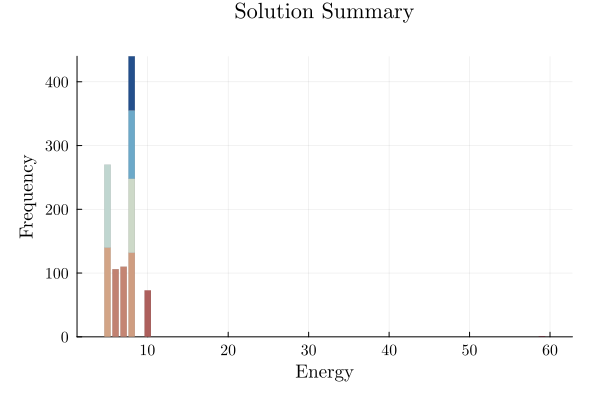

In [11]:
# plot(QUBOTools.EnergyFrequencyPlot(ising_model))
plot(QUBOTools.EnergyFrequencyPlot(QUBOTools.solution(unsafe_backend(ising_model))))

We are going to use the default limits of temperature given by the simulating annealing code. These are defined using the minimum and maximum nonzero coefficients in the Ising model. Then the range for beta is defined as 

$$
\beta \in \left[ \frac{\log(2)}{\max \{ \Delta E \} },\frac{\log(100)}{\min \{ \Delta E \} } \right]
$$

where

$$
\Delta E = \min_{i} \{h_i \} + \sum_j J_{ij}+J_{ji}
$$

Hot temperature: We want to scale hot_beta so that for the most unlikely qubit flip, we get at least 50% chance of flipping. (This means all other qubits will have > 50% chance of flipping initially). Most unlikely flip is when we go from a very low energy state to a high energy state, thus we calculate hot_beta based on max_delta_energy.

$$
0.50 = \exp(-\overline{\beta} * \max \{ \Delta E \})
$$

Cold temperature: Towards the end of the annealing schedule, we want to minimize the chance of flipping. Don't want to be stuck between small energy tweaks. Hence, set cold_beta so that at minimum energy change, the chance of flipping is set to 1%.

$$
0.01 = \exp(-\underline{\beta} * \min \{ \Delta E \})
$$

By default, the schedule also follows a geometric series.

In [12]:
function geomspace(a, b; length = 100)
    return exp10.(range(log10(a), log10(b); length))
end

geomspace (generic function with 1 method)

In [13]:
# data = QUBOTools.metadata(QUBOTools.solution(qubo_model))
# info = data["info"]

β₀, β₁ = (2.0, 100.0) # info["beta_range"]

(2.0, 100.0)

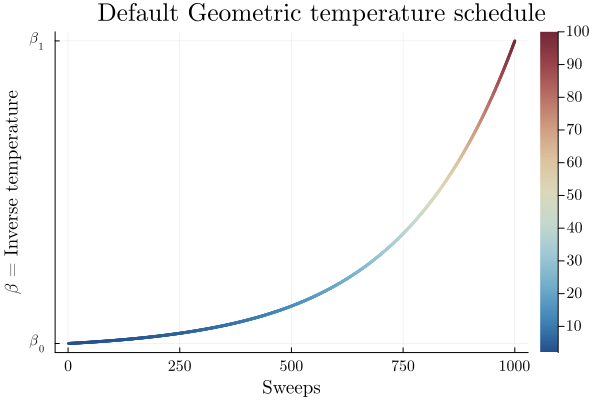

In [14]:
function plot_schedule(β₀, β₁; length = 1_000, title = "Default Geometric temperature schedule")
    β = geomspace(β₀, β₁; length=length)

    plt = plot(;
        plot_title = title,
        xlabel     = "Sweeps",
        ylabel     = raw"$ \beta $ = Inverse temperature",
        
    )

    plot!(
        plt, β;
        color     = cgrad(:redblue; rev=true),
        linestyle = :dot,
        linewidth = 3,
        line_z    = β,
        legend    = nothing,
        yticks    = ([β₀, β₁], [raw"$ \beta_{0} $", raw"$ \beta_{1} $"]),
    )

    return plt
end

plot_schedule(β₀, β₁)

In [15]:
sweeps    = [1:250; 260:10:1_000]
schedules = ["geometric", "linear"]

s = 0.99 # Success probability
λ⃰ = 5.0  # Optimal Energy \lambda[tab]\asteraccent[tab]

results = Dict{Symbol,Any}(
    :p   => Dict{String,Any}(), # Success probability
    :t   => Dict{String,Any}(), # Time elapsed
    :ttt => Dict{String,Any}(), # Time-to-target
)

set_attribute(ising_model, "num_reads", 1_000)

for schedule in schedules
    results[:p][schedule]   = Float64[]
    results[:t][schedule]   = Float64[]
    results[:ttt][schedule] = Float64[]

    set_attribute(ising_model, "beta_schedule_type", schedule)

    for sweep in sweeps
        set_attribute(ising_model, "num_sweeps", sweep)

        optimize!(ising_model)

        sol = QUBOTools.solution(unsafe_backend(ising_model))
        p   = QUBOTools.success_rate(sol, λ⃰)
        t   = QUBOTools.effective_time(sol) # TODO: Should be 'total_time'?
        ttt = QUBOTools.ttt(sol, λ⃰, s)

        push!(results[:p][schedule], p)
        push!(results[:t][schedule], t)
        push!(results[:ttt][schedule], ttt)
    end
end

results

Dict{Symbol, Any} with 3 entries:
  :p   => Dict{String, Any}("geometric"=>[0.632, 0.531, 0.426, 0.374, 0.368, 0.…
  :ttt => Dict{String, Any}("geometric"=>[0.00663585, 0.013929, 0.0158606, 0.02…
  :t   => Dict{String, Any}("geometric"=>[0.00144049, 0.00229012, 0.0019119, 0.…

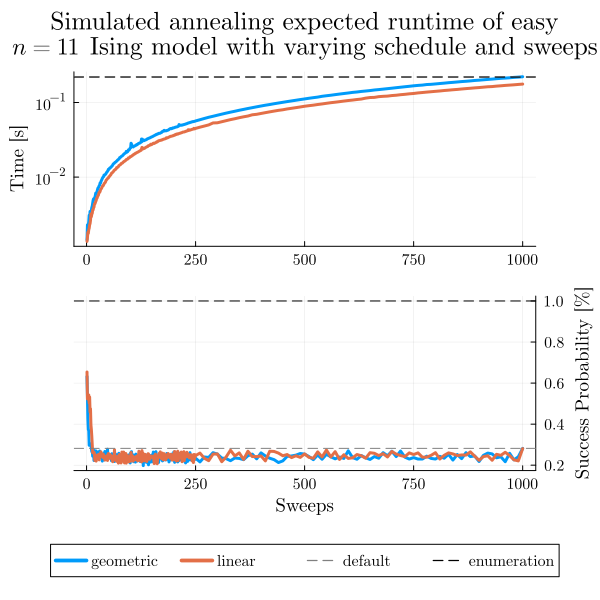

In [16]:
function plot_schedule_grid(sweeps, schedules, results)
    plt = plot(;
        layout     = @layout([a{0.475h}; b{0.475h}; leg{0.05h}]),
        size       = (600, 600),
        plot_title = raw"""
            Simulated annealing expected runtime of easy
            $ n = 11 $ Ising model with varying schedule and sweeps
            """,
        plot_titlevspan = 0.1,
    )

    # Elapsed time
    plot!(
        plt;
        subplot = 1,
        ylabel  = "Time [s]",
        yscale  = :log10,
        legend  = false,
    )

    for schedule in schedules
        plot!(
            plt, sweeps, results[:t][schedule];
            subplot   = 1,
            linestyle = :solid,
            label     = schedule,
            linewidth = 3,
        )
    end

    hline!(
        plt, [results[:t]["geometric"][end]];
        subplot   = 1,
        linestyle = :dash,
        label     = "default",
        color     = :gray,
        linewidth = 1,
    )

    hline!(
        plt, [enumeration_time];
        subplot    = 1,
        linestyle  = :dash,
        label      = "enumeration",
        color      = :black,
        linewidth  = 1,
    )

    # Success probability
    plot!(
        plt;
        subplot = 2,
        xlabel  = "Sweeps",
        ylabel  = "Success Probability [%]",
        legend  = false,
    )

    for schedule in schedules
        plot!(
            plt, sweeps, results[:p][schedule];
            subplot   = 2,
            linestyle = :solid,
            label     = schedule,
            ymirror   = true,
            linewidth = 3,
        )
    end
    
    hline!(
        plt, [results[:p]["geometric"][end]];
        subplot    = 2,
        linestyle  = :dash,
        label      = "default",
        color      = :gray,
        linewidth  = 1,
    )

    hline!(
        plt, [1.0];
        subplot    = 2,
        linestyle  = :dash,
        label      = "enumeration",
        color      = :black,
        linewidth  = 1,
    )

    # Legend
    plot!(
        plt, (1:4)';
        subplot       = 3,
        framestyle    = nothing,
        showaxis      = false,
        grid          = false,
        linestyle     = [:solid :solid :dash :dash],
        color         = [1 2 :gray :black],
        label         = ["geometric" "linear" "default" "enumeration"],
        linewidth     = [3 3 1 1],
        legend        = :top,
        legend_column = 4,
    )

    return plt
end

plot_schedule_grid(sweeps, schedules, results)

These plots represent often contradictory metrics: on one hand you would like to obtain a large probability of finding a right solution (the definition of right comes from what you define as success).
On the other hand, the time it takes to solve these cases should be as small as possible.
This is why we are interested in a metric that combines both, and that is why we settle on the Time To Solution (TTS) which is defined as

$$
TTS = \frac{\log{1-s}}{\log{1-p}}
$$

where s is a success factor, usually takes as $s = 99\%$, and $p$ is the success probability, usually accounted as the observed success probability.

One usually reads this as the time to solution within $99\%$ probability.

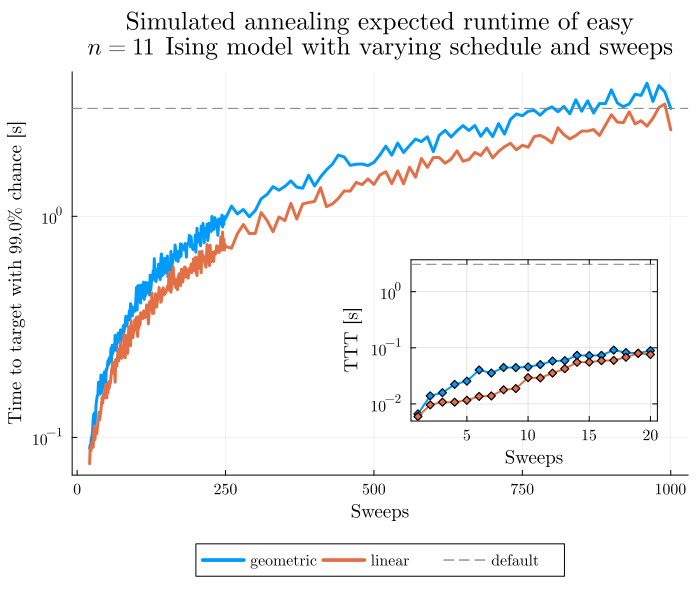

In [17]:
function plot_ttt_grid(sweeps, schedules, results, k = 20)
    
    plt = plot(;
        layout     = @layout([a{0.95h}; leg{0.05h}]),
        size       = (700, 600),
        plot_title = raw"""
            Simulated annealing expected runtime of easy
            $ n = 11 $ Ising model with varying schedule and sweeps
            """,
        plot_titlevspan = 0.1,
        plot_titlefont  = Plots.font(16, "Computer Modern"),
        titlefont       = Plots.font(14, "Computer Modern"),
        guidefont       = Plots.font(12, "Computer Modern"),
        legendfont      = Plots.font(10, "Computer Modern"),
        tickfont        = Plots.font(10, "Computer Modern"),
        inset_subplots  = [(1, bbox(0.25,0.166,0.4,0.4, :center))],
    )

    # Elapsed time
    plot!(
        plt;
        subplot = 1,
        xlabel  = "Sweeps",
        ylabel  = "Time to target with \$ $(100s) \\% \$ chance [s]",
        legend  = false,
        legend_column = 3,
    )

    for schedule in schedules
        plot!(
            plt, sweeps[k+1:end], results[:ttt][schedule][k+1:end];
            subplot   = 1,
            linestyle = :solid,
            label     = schedule,
            yscale    = :log10,
            linewidth = 3,
        )
    end

    # Value for the default solution
    hline!(
        plt, [results[:ttt]["geometric"][end]];
        subplot    = 1,
        linestyle  = :dash,
        label      = "default",
        color      = :gray,
        linewidth  = 1,
    )
    
    # Legend
    plot!(
        plt, (1:3)';
        subplot = 2,
        framestyle = nothing,
        showaxis   = false,
        grid       = false,
        linestyle  = [:solid :solid :dash],
        linewidth  = [3 3 1],
        color      = [1 2 :gray],
        label      = ["geometric" "linear" "default"],
        legend     = :top,
        legend_column = 3,
    )
    
    plot!(
        plt[3];
        xlabel     = "Sweeps",
        ylabel     = "TTT [s]",
        yscale     = :log10,
        legend     = false,
        framestyle = :box,

    )
    
    for schedule in schedules
        plot!(
            plt[3], sweeps[1:k], results[:ttt][schedule][1:k];
            linewidth  = 2,
            marker     = :diamond,
            markersize = 4,
        )
    end

    hline!(
        plt[3], [results[:ttt]["geometric"][end]];
        linestyle = :dash,
        color     = :gray,
        linewidth = 1,
    )

    return plt
end

plot_ttt_grid(sweeps, schedules, results)

As you can notice, the default parameters given by D-Wave (number of sweeps = $1000$ and a geometric update of $\beta$) are not optimal for our tiny example in terms of expected runtime.
This is certainly a function of the problem, for such a small instance having two sweeps are more than enough and more sweeps are an overkill.
This parameters choice might not generalize to any other problem, as seen below.

## Example 2
Let's define a larger model, with 100 variables and random weights, to see how this performance changes.

Assume that we are interested at the instance created with random weights $h_{i}, J_{i, j} \sim U[-1, +1]$.

In [18]:
using Random

In [19]:
# Number of variables
n = 100

# Fixing the random seed to get the same result
Random.seed!(1)

# We only consider upper triangular matrix ignoring the diagonal
J = triu!(2rand(Float64, n, n) .- 1, 1)
h = 2rand(Float64, n) .- 1

;

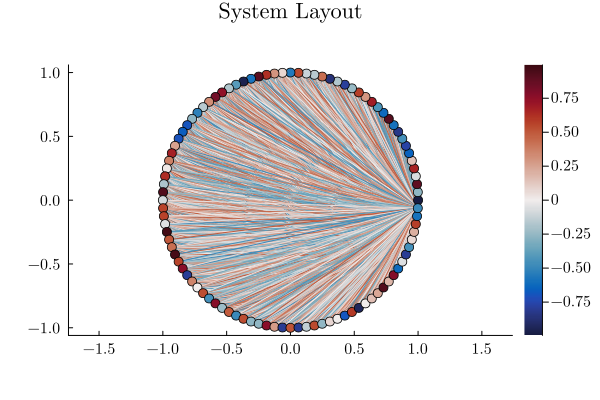

In [20]:
plot(QUBOTools.SystemLayoutPlot((J + J') / 2 + diagm(h)))

For a problem of this size we cannot do a complete enumeration ($2^{100} \approx 1.2e30$) but we can randomly sample the distribution of energies to have a baseline for our later comparisons.

In [21]:
random_ising_model = Model()

@variable(random_ising_model, s[1:n], Spin)

@objective(random_ising_model, Min, s' * J * s + h' * s)

random_ising_model

A JuMP Model
├ solver: none
├ objective_sense: MIN_SENSE
│ └ objective_function_type: QuadExpr
├ num_variables: 100
├ num_constraints: 100
│ └ VariableRef in Spin: 100
└ Names registered in the model
  └ :s

In [22]:
using Statistics

In [23]:
set_optimizer(random_ising_model, QUBO.RandomSampler.Optimizer)
set_attribute(random_ising_model, "num_reads", 1_000)

optimize!(random_ising_model)

random_sampling_time = solve_time(random_ising_model)

energies = [objective_value(random_ising_model; result = i) for i = 1:result_count(random_ising_model)]

random_mean_energy = mean(energies)

@info "Average random energy = $(random_mean_energy)"

[ Info: Average random energy = 0.27531040796526246


In [24]:
set_optimizer(random_ising_model, DWave.Neal.Optimizer)
set_attribute(random_ising_model, "num_reads", 1_000)

optimize!(random_ising_model)

@info "Simulated Annealing best energy = $(objective_value(random_ising_model))"

[ Info: Simulated Annealing best energy = -408.47197451530735


Notice that the minimum energy coming from the random sampling and the one from the simulated annealing are very different. 
Moreover, the distributions that both lead to are extremely different too.

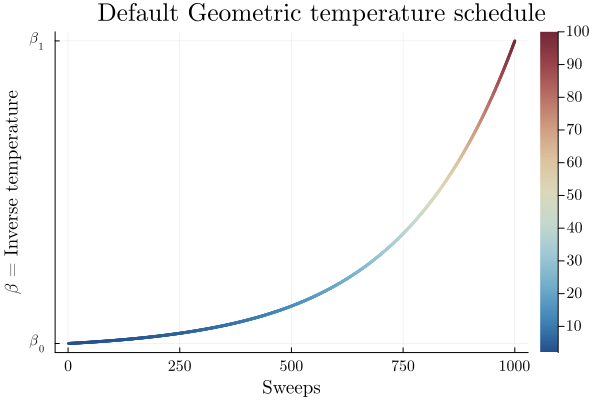

In [25]:
# data = QUBOTools.metadata(QUBOTools.solution(qubo_model))
# info = data["info"]

β₀, β₁ = (2.0, 100.0) # info["beta_range"]

plot_schedule(β₀, β₁)

We can solve this problem using IP such that we have guarantees that it is solved to optimality (this might be a great quiz for future lectures), but in this case let us define the "success" as getting an objective certain percentage of the best found solution in all cases (which we see it might not be even found with the default parameters).
To get a scaled version of this success equivalent for all instances, we will define this success with respect to the metric:

$$
\frac{\textrm{found} - \textrm{random}}{\textrm{minimum} - \textrm{random}}
$$

Where $\textrm{found}$ corresponds to the best found solution within our sampling, $\textrm{random}$ is the mean of the random sampling shown above, and $\textrm{minimum}$ corresponds to the best found solution to our problem during the exploration.
Consider that this minimum might not be the global minimum.
This metric is very informative given that the best performance you can have is $1$, being at the minimum, and negative values would correspond to a method that at best behaves worse that the random sampling.
Success now is counted as being within certain treshold of this value of $1$.
We will refer to this quality of solution metric as Performance Ratio.

Before figuring out if we have the right optimal parameters, we want to save some effort by loading previously computed results.
    If you do not want to load the results that we are providing, feel free to change the `overwrite_pickles` variable, at the expense that it will take some time (around 3 minutes per instance) to run.
    If you do not want to wait, drop the `results.zip` file in the folder that is about to be created.

In [26]:
pickle_path = joinpath(@__DIR__, "results")

if !isdir(pickle_path)
    @warn "Results directory '$pickle_path' does not exist. We will create it."

    mkpath(pickle_path)
end

┌ Warning: Results directory '/home/jvpcms/purdue-internship/QUBONotebooksFork/notebooks_jl/results' does not exist. We will create it.
└ @ Main In[26]:4


"/home/jvpcms/purdue-internship/QUBONotebooksFork/notebooks_jl/results"

Put the file in there and we will decompress it for you.

In [27]:
import ZipFile

zip_name = joinpath(pickle_path, "results.zip")

overwrite_pickles = false
use_raw_data      = false

if isfile(zip_name) && use_raw_data
    run(`gzip -d $pickle_path`)

    @info("Results zip file has been extrated to '$pickle_path'")
end

[ Info: Precompiling ZipFile [a5390f91-8eb1-5f08-bee0-b1d1ffed6cea] (cache misses: incompatible header (2))

SYSTEM: caught exception of type :MethodError while trying to print a failed Task notice; giving up


In [28]:
function QUBOTools.write_solution(
        io::IO,
        sol::S,
        fmt::QUBOTools.BQPJSON,
        ) where {S}
    if !isempty(sol)
        
        metadata = try
            QUBOTools.metadata(sol)
        catch
            @warn "Could not extract metadata from solution. Saving empty metadata."
            Dict{String,Any}() # Fallback
        end

        json_data = Dict{String,Any}(
            "id"              => 0,
            "variable_domain" => QUBOTools._BQPJSON_VARIABLE_DOMAIN(QUBOTools.domain(sol)),
            "linear_terms"    => Dict{String,Any}[],
            "quadratic_terms" => Dict{String,Any}[],
            "variable_ids"    => 1:QUBOTools.dimension(sol),
            "scale"           => 1,
            "offset"          => 0,
            "metadata"        => Dict{String,Any}(),
            "version"         => string(fmt.version),
        )
        
        sol_id = 0

        solutions = Dict{String,Any}[]

        for s in sol
            assignment = Dict{String,Any}[
                Dict{String,Any}("id" => i, "value" => QUBOTools.state(s, i))
                for i in 1:QUBOTools.dimension(sol)
            ]

            evaluation = QUBOTools.value(s)

            for _ = 1:reads(s)
                push!(
                    solutions,
                    Dict{String,Any}(
                        "id"         => (sol_id += 1),
                        "assignment" => assignment,
                        "evaluation" => evaluation,
                    ),
                )
            end
        end

        json_data["solutions"] = solutions

        QUBOTools.JSON.print(io, json_data)
        
        return nothing
    end
end

In [29]:
function QUBOTools.read_solution(io::IO, ::QUBOTools.BQPJSON)
    # Parse the entire JSON file
    data = JSON.parse(io)
    
    solutions_list = data["solutions"]
    metadata = data["metadata"]
    
    # 1. Reconstruct occurrences
    # [cite_start]The writer "flattens" the solution by 'reads' [cite: 42-44]. We must group them back.
    # Dict{Vector{Int}, Tuple{Float64, Int}} maps: state => (energy, reads)
    grouped_sols = Dict{Vector{Int}, Tuple{Float64, Int}}()

    for sol_json in solutions_list
        energy = sol_json["evaluation"]
        assignment_list = sol_json["assignment"]
        
        # Sort by "id" to ensure the state vector is in the correct order
        sort!(assignment_list, by = x -> x["id"])
        
        # Create the state vector
        spin_vector = [Int(a["value"]) for a in assignment_list]
        
        if haskey(grouped_sols, spin_vector)
            # Increment read count for this state
            (current_energy, current_reads) = grouped_sols[spin_vector]
            grouped_sols[spin_vector] = (current_energy, current_reads + 1)
        else
            # Add new state with 1 read
            grouped_sols[spin_vector] = (energy, 1)
        end
    end
    
    # 2. Convert grouped data back into QUBOTools.Sample objects
    samples = QUBOTools.Sample[]
    for (state, (value, reads)) in grouped_sols
        push!(samples, QUBOTools.Sample(state, value, reads))
    end
    
    # Sort samples by energy (standard practice)
    sort!(samples, by = QUBOTools.value)
    
    # 3. Re-create the Solution object
    # We assume :spin domain, as used in the model definition
    domain = :spin
    
    return QUBOTools.solution(samples, metadata, domain)
end

Now either we have the pickled file or not, let us compute the statistics we are looking for.

In [31]:
using Statistics
using JSON
using StatsBase

s         = 0.99  # This is the success probability for the ttt calculation
threshold = 5.0  # This is a percentual threshold of what the minimum energy should be

sweeps    = [1:250;260:10:1_000]
schedules = ["geometric", "linear"]

total_reads    = 1_000
default_sweeps = 1_000
n_boot         = 500
ci             = 68  # Confidence interval for bootstrapping
default_boots  = default_sweeps

boots = [1, 10, default_boots]

min_energy = -239.7094652034834
random_energy = random_mean_energy

instance     = 42
results_name = "results_$(instance).json"
results_name = joinpath(pickle_path, results_name)
results = Dict{Symbol,Any}(
    :p             => Dict{Int,Any}(),
    :min_energy    => Dict{String,Any}(),
    :random_energy => Dict{String,Any}(),
    :ttt           => Dict{Int,Any}(),
    :tttci         => Dict{Int,Any}(),
    :t             => Dict{String,Any}(),
    :best          => Dict{Int,Any}(),
    :bestci        => Dict{Int,Any}(),
)
# If you wanto to use the raw data and process it here
if use_raw_data || !isfile(results_name)
    # If you want to generate the data or load it here
    overwrite_pickles = false

    for boot in boots
        results[:p][boot]      = Dict()
        results[:ttt][boot]    = Dict()
        results[:tttci][boot]  = Dict()
        results[:best][boot]   = Dict()
        results[:bestci][boot] = Dict()
    end

    for schedule in schedules
        probs       = Dict{Int,Any}(k => [] for k in boots)
        time_to_sol = Dict{Int,Any}(k => [] for k in boots)
        prob_np     = Dict{Int,Any}(k => [] for k in boots)
        tttcs       = Dict{Int,Any}(k => [] for k in boots)
        times       = []
        b           = Dict{Int,Any}(k => [] for k in boots)
        bnp         = Dict{Int,Any}(k => [] for k in boots)
        bcs         = Dict{Int,Any}(k => [] for k in boots)

        for sweep in sweeps
            # Gather instance names
            pickle_name = joinpath(pickle_path, "$instance)_$(schedule)_$(sweep).p")

            # If the instance data exists, load the data
            if isfile(pickle_name) && !overwrite_pickles
                # print(pickle_name)
                sol    = QUBOTools.read_solution(pickle_name)
                time_s = QUBOTools.effective_time(sol)
            else # If it does not exist, generate the data
                set_attribute(random_ising_model, "num_reads", total_reads)
                set_attribute(random_ising_model, "num_sweeps", sweep)
                set_attribute(random_ising_model, "beta_schedule_type", schedule)

                optimize!(random_ising_model)

                sol = QUBOTools.solution(unsafe_backend(random_ising_model))
                time_s = QUBOTools.effective_time(sol)

                file_name = "solutions_$(total_reads)_$(sweep)_$(schedule).json"
                file_name = joinpath(pickle_path, file_name)
                
                open(file_name, "w") do io
                    QUBOTools.write_solution(io, sol, QUBOTools.BQPJSON())
                end
            end

            # Compute statistics
            energies     = QUBOTools.value.(sol)
            occurrences  = QUBOTools.reads.(sol)
            total_counts = sum(occurrences)

            push!(times, time_s)
            
            if minimum(energies) < min_energy
                min_energy = minimum(energies)
                @info("A better solution of '$(min_energy)' was found for sweep '$sweep'")
            end

            # success = min_energy*(1.0 + threshold/100.0)**np.sign(min_energy)
            success = random_energy - (random_energy - min_energy)*(1.0 - threshold/100.0)

            # Best of boot samples es computed via n_boot bootstrappings
            boot_dist = Dict{Int,Any}()
            pr_dist   = Dict{Int,Any}()
            cilo = Dict{Int,Any}()
            ciup = Dict{Int,Any}()
            pr = Dict{Int,Any}()
            pr_cilo = Dict{Int,Any}()
            pr_ciup = Dict{Int,Any}()

            for boot in boots
                boot_dist[boot] = []
                pr_dist[boot]   = []

                for i in 1:n_boot
                    resampler = rand(1:min(total_reads, length(energies)), boot)
                    sample_boot = energies[resampler]

                    # Compute the best along that axis
                    push!(boot_dist[boot], minimum(sample_boot))

                    occurences = occurrences[resampler]
                    counts     = Dict{Float64,Int}() 

                    for (index, energy) in enumerate(sample_boot)
                        if energy in keys(counts)
                            counts[energy] += occurences[index]
                        else
                            counts[energy] = occurences[index]
                        end
                    end

                    try
                        push!(
                            pr_dist[boot],
                            sum(counts[key] for key in keys(counts) if key < success) / boot
                        )
                    catch e
                        push!(
                            pr_dist[boot],
                            0
                        )
                    end
                end

                push!(b[boot], mean(boot_dist[boot]))

                # Confidence intervals from bootstrapping the best out of boot
                bnp[boot]  = boot_dist[boot]
                cilo[boot] = percentile(bnp[boot], 50 - ci / 2)
                ciup[boot] = percentile(bnp[boot], 50 + ci / 2)

                push!(bcs[boot], (cilo[boot], ciup[boot]))

                # Confidence intervals from bootstrapping the ttt of boot
                prob_np[boot] = pr_dist[boot]
                pr[boot]      = mean(prob_np[boot])
                if pr[boot] >= 1
                    pr[boot] = 1 - 1E-9
                end

                push!(probs[boot], pr[boot])

                if !all(x -> x > 0, prob_np[boot])
                    push!(time_to_sol[boot], Inf)
                    push!(tttcs[boot], (Inf, Inf))
                else

                    pr_cilo[boot] = percentile(prob_np[boot], 50 - ci / 2)
                    if pr_cilo[boot] >= 1
                        pr_cilo[boot] = 1 - 1E-9
                    end

                    pr_ciup[boot] = percentile(prob_np[boot], 50 + ci / 2)
                    if pr_ciup[boot] >= 1
                        pr_ciup[boot] = 1 - 1E-9
                    end
                    
                    try
                        push!(time_to_sol[boot], time_s * log10(1-s) / log10(1 - pr[boot] + 1E-9))
                        push!(
                            tttcs[boot],
                            (
                                time_s*log10(1-s)/log10(1 - pr_cilo[boot]),
                                time_s*log10(1-s)/log10(1 - pr_ciup[boot])
                            )
                        )
                    catch e
                        println(s)
                        println(pr[boot] + 1E-9)
                        println(pr_cilo[boot])
                        println(pr_ciup[boot])
                        println(1-pr_ciup[boot])
                        throw(e)
                    end
                end
            end
        end

        results[:t][schedule]             = times
        results[:min_energy][schedule]    = min_energy
        results[:random_energy][schedule] = random_energy

        for boot in boots
            results[:p][boot][schedule]     = probs[boot]
            results[:ttt][boot][schedule]   = time_to_sol[boot]
            results[:tttci][boot][schedule] = tttcs[boot]
            results[:best][boot][schedule]  = [
                (random_energy - energy) / (random_energy - min_energy)
                for energy in b[boot]
            ]
            results[:bestci][boot][schedule] = [
                tuple(((random_energy - element) / (random_energy - min_energy) for element in energy)...)
                for energy in bcs[boot]
            ]
        end
    end

    open(results_name, "w") do io
        JSON.print(io, results)
    end
else  # Just reload processed datafile
    string_dict = JSON.parsefile(results_name)

    int_nested_keys = Set([:p, :ttt, :tttci, :best, :bestci])
    results = Dict{Symbol, Any}()

    for (k_str, v) in string_dict
        k_sym = Symbol(k_str) # Convert top-level key to Symbol
        
        if k_sym in int_nested_keys
            results[k_sym] = Dict(parse(Int, sub_k) => sub_v for (sub_k, sub_v) in v)
        else
            results[k_sym] = v
        end
    end
end


[ Info: A better solution of '-372.52115384856893' was found for sweep '1'
[ Info: A better solution of '-393.3319194709667' was found for sweep '3'
[ Info: A better solution of '-398.3924251277176' was found for sweep '4'
[ Info: A better solution of '-404.9837686028735' was found for sweep '5'
[ Info: A better solution of '-408.2470539229058' was found for sweep '6'
[ Info: A better solution of '-408.47197451530735' was found for sweep '8'


After gathering all the results, we would like to see the progress of the Performance Ratio with respect to the increasing number of sweeps. 
To account for the stochasticity of this method, we are bootstrapping all of our results with different values of the bootstrapping sample, and each confidence interval corresponds to a standard deviation away from the mean.

In [32]:
function plot_progress(sweeps, boots, schedules, results)
    plt = plot(;
        plot_title = """
            Simulated annealing Performance Ratio of Ising 42 N=100
            with varying schedule, $(n_boot) bootstrap re-samples, and sweeps
            """,
        xscale     = :log10,
        # xlims      = (1, 200),
        ylims      = (0.8, 1.01),
        xlabel     = "Sweeps",
        ylabel     = raw"Performance Ratio = \
            $\frac{\textrm{best found} - \textrm{random sample}}\
            {\textrm{min energy} - \textrm{random sample}}$",
        legend     = :outertop,
    )


    for boot in boots
        for schedule in schedules
            bestnp = transpose(stack(results[:bestci][boot][schedule], dims=1))

            plot!(
                plt,
                sweeps, bestnp[0];
                fillrange = bestnp[1],
                fillalpha = 0.25,
            )

            plot!(
                plt,
                sweeps, results[:best][boot][schedule];
                label = "$schedule, $boot reads",
            )
        end
    end
end


plot_progress (generic function with 1 method)

Now, besides looking at the sweeps, which are our parameter, we want to see how the performance changes with respect to the number of shots, which in this case are proportional to the computational time/effort that it takes to solve the problem.

┌ Warning: No strict ticks found
└ @ PlotUtils ~/.julia/packages/PlotUtils/dVEMd/src/ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils ~/.julia/packages/PlotUtils/dVEMd/src/ticks.jl:194


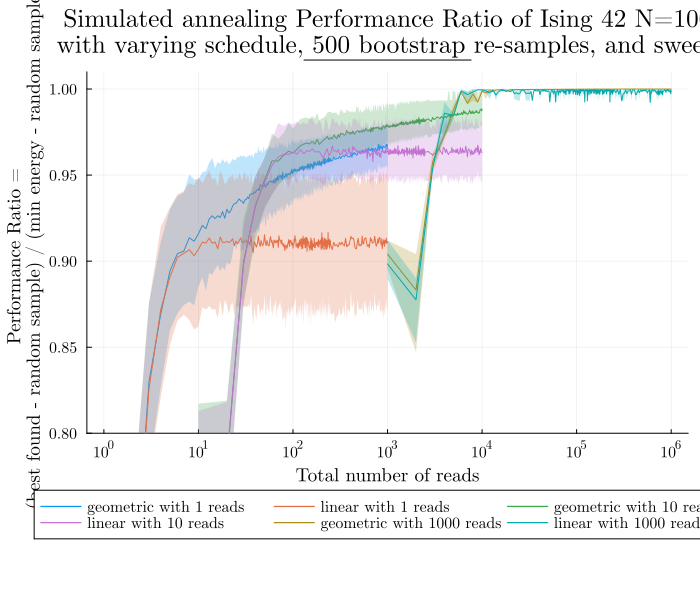

┌ Warning: No strict ticks found
└ @ PlotUtils ~/.julia/packages/PlotUtils/dVEMd/src/ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils ~/.julia/packages/PlotUtils/dVEMd/src/ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils ~/.julia/packages/PlotUtils/dVEMd/src/ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils ~/.julia/packages/PlotUtils/dVEMd/src/ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils ~/.julia/packages/PlotUtils/dVEMd/src/ticks.jl:194


In [33]:
# 1. Define labels and title
title_str = "Simulated annealing Performance Ratio of Ising 42 N=100\n with varying schedule, $n_boot bootstrap re-samples, and sweeps"
ylabel_str = "Performance Ratio = \n (best found - random sample) / (min energy - random sample)"
xlabel_str = "Total number of reads"

# 2. Create an empty plot object
p = plot()

# 3. Loop and add all your data to 'p'
for boot in boots
    reads = [s * boot for s in sweeps]
    for schedule in schedules
        label_str = "$schedule with $boot reads"
        
        mean_line = results[:best][boot][schedule]
        ci_data = results[:bestci][boot][schedule]
        low_bound = getindex.(ci_data, 1)
        high_bound = getindex.(ci_data, 2)

        # Plot directly to 'p'
        plot!(p, reads, mean_line, 
              ribbon=(mean_line .- low_bound, high_bound .- mean_line),
              fillalpha=0.25,
              label=label_str)
    end
end

# 4. Apply all formatting to 'p' at the very end
plot!(p,
    # --- Size and Spacing (to fix cramping) ---
    size = (700, 600),
    plot_titlevspan = 0.1,      # Adds padding for the title
    
    # --- Labels and Title ---
    plot_title = title_str,
    xlabel = xlabel_str,
    ylabel = ylabel_str,
    
    # --- Axes ---
    xscale = :log10,
    ylims = (0.8, 1.01),

    # --- Legend (This is the fix) ---
    legend = :outerbottom,      # Move legend outside, to the bottom
    legend_columns = 3,
    
    # --- Fonts ---
    plot_titlefont  = Plots.font(16, "Computer Modern"),
    guidefont       = Plots.font(12, "Computer Modern"),
    legendfont      = Plots.font(10, "Computer Modern"),
    tickfont        = Plots.font(10, "Computer Modern")
)

# 5. Display the final plot
display(p)

┌ Warning: No strict ticks found
└ @ PlotUtils ~/.julia/packages/PlotUtils/dVEMd/src/ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils ~/.julia/packages/PlotUtils/dVEMd/src/ticks.jl:194


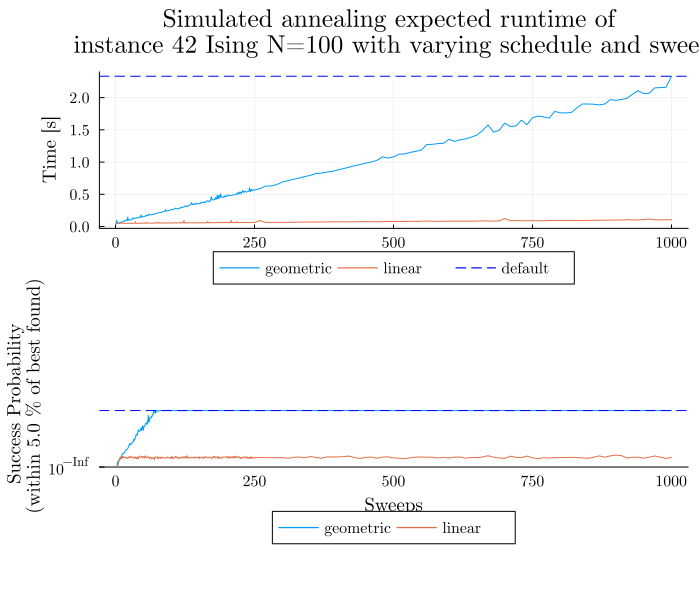

┌ Warning: n° of legend_column=3 is larger than n° of series=2
└ @ Plots ~/.julia/packages/Plots/8ZnR3/src/backends/gr.jl:1238
┌ Warning: No strict ticks found
└ @ PlotUtils ~/.julia/packages/PlotUtils/dVEMd/src/ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils ~/.julia/packages/PlotUtils/dVEMd/src/ticks.jl:194
┌ Warning: n° of legend_column=3 is larger than n° of series=2
└ @ Plots ~/.julia/packages/Plots/8ZnR3/src/backends/gr.jl:1238
┌ Warning: No strict ticks found
└ @ PlotUtils ~/.julia/packages/PlotUtils/dVEMd/src/ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils ~/.julia/packages/PlotUtils/dVEMd/src/ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils ~/.julia/packages/PlotUtils/dVEMd/src/ticks.jl:194
┌ Warning: n° of legend_column=3 is larger than n° of series=2
└ @ Plots ~/.julia/packages/Plots/8ZnR3/src/backends/gr.jl:1238


In [34]:
using Plots

# 1. Create the two plot objects (ax1 and ax2)
p1 = plot()
# ax2.semilogy(...) is handled by setting yscale=:log10
p2 = plot(yscale=:log10) 

# 2. Store the super-title string (using Julia's interpolation)
# fig.suptitle(...)
title_str = "Simulated annealing expected runtime of \n instance $instance Ising N=100 with varying schedule and sweeps"

# --- Plot 1 (ax1) ---
for schedule in schedules
    # ax1.plot(...)
    # Use symbol :t for the key, as per your results dictionary
    plot!(p1, sweeps, results[:t][schedule], label=schedule)
end

# ax1.hlines(...)
# Python's -1 index is `end` in Julia
y_val_1 = results[:t]["geometric"][end]
# `linestyle` and `color` are keywords, and we apply the label "default" here
hline!(p1, [y_val_1], linestyle=:dash, label="default", color=:blue)

# ax1.set(ylabel=...)
ylabel!(p1, "Time [s]")


# --- Plot 2 (ax2) ---
for schedule in schedules
    # ax2.semilogy(...)
    # Use symbol :p for the key
    plot!(p2, sweeps, results[:p][default_sweeps][schedule], label=schedule)
end

# ax2.hlines(...)
y_val_2 = results[:p][default_sweeps]["geometric"][end]
# We add the line, but set label="" to avoid a duplicate "default" in the legend
hline!(p2, [y_val_2], linestyle=:dash, label="", color=:blue)

# ax2.set(ylabel=...)
ylabel!(p2, "Success Probability \n (within $threshold % of best found)")
# ax2.set(xlabel=...)
xlabel!(p2, "Sweeps")


# --- Combine Plots (This block is updated) ---
p_final = plot(p1, p2, 
    layout = (2, 1),
    plot_title = title_str,
    
    # --- Fixes from previous plot ---
    size = (700, 600),             # Give the plot more space
    plot_titlevspan = 0.1,         # Add vertical padding for the title
    
    # --- Legend settings (already correct) ---
    legend = :outerbottom,
    legend_columns = 3,
    
    # --- Add professional fonts ---
    plot_titlefont  = Plots.font(16, "Computer Modern"),
    titlefont       = Plots.font(14, "Computer Modern"),
    guidefont       = Plots.font(12, "Computer Modern"),
    legendfont      = Plots.font(10, "Computer Modern"),
    tickfont        = Plots.font(10, "Computer Modern")
)

# 6. Display the final combined plot
display(p_final)

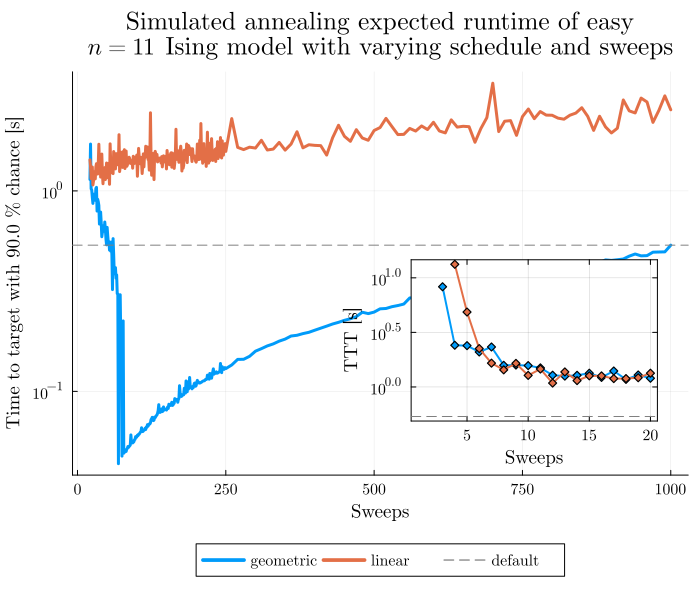

In [35]:
function plot_ttt_grid_adapted(sweeps, schedules, results; 
                        main_boot, 
                        inset_boot, 
                        main_hline_boot, 
                        inset_hline_boot, 
                        k = 20, 
                        s = 0.9)
    
    plt = plot(;
        layout     = @layout([a{0.95h}; leg{0.05h}]),
        size       = (700, 600),
        plot_title = raw"""
            Simulated annealing expected runtime of easy
            $ n = 11 $ Ising model with varying schedule and sweeps
            """,
        plot_titlevspan = 0.1,
        plot_titlefont  = Plots.font(16, "Computer Modern"),
        titlefont       = Plots.font(14, "Computer Modern"),
        guidefont       = Plots.font(12, "Computer Modern"),
        legendfont      = Plots.font(10, "Computer Modern"),
        tickfont        = Plots.font(10, "Computer Modern"),
        inset_subplots  = [(1, bbox(0.25,0.166,0.4,0.4, :center))],
    )

    plot!(
        plt;
        subplot = 1,
        xlabel  = "Sweeps",
        ylabel  = "Time to target with $(100*s) % chance [s]", 
        legend  = false,
        legend_column = 3,
    )

    for schedule in schedules
        data_dirty = results[:ttt][main_boot][schedule]
        data = replace(data_dirty, nothing => NaN)
        
        plot!(
            plt, sweeps[k+1:end], data[k+1:end];
            subplot   = 1,
            linestyle = :solid,
            label     = schedule,
            yscale    = :log10,
            linewidth = 3,
        )
    end

    hline_val_dirty = results[:ttt][main_hline_boot]["geometric"][end]
    hline_val = (hline_val_dirty === nothing) ? NaN : hline_val_dirty
    
    hline!(
        plt, [hline_val];
        subplot    = 1,
        linestyle  = :dash,
        label      = "default",
        color      = :gray,
        linewidth  = 1,
    )
    
    plot!(
        plt, (1:3)';
        subplot = 2,
        framestyle = nothing,
        showaxis   = false,
        grid       = false,
        linestyle  = [:solid :solid :dash],
        linewidth  = [3 3 1],
        color      = [1 2 :gray],
        label      = ["geometric" "linear" "default"],
        legend     = :top,
        legend_column = 3,
    )
    
    plot!(
        plt[3];
        xlabel     = "Sweeps",
        ylabel     = "TTT [s]",
        yscale     = :log10,
        legend     = false,
        framestyle = :box,
    )
    
    for schedule in schedules
        data_dirty = results[:ttt][inset_boot][schedule]
        data = replace(data_dirty, nothing => NaN)
        
        plot!(
            plt[3], sweeps[1:k], data[1:k];
            linewidth  = 2,
            marker     = :diamond,
            markersize = 4,
        )
    end

    hline_val_inset_dirty = results[:ttt][inset_hline_boot]["geometric"][end]
    hline_val_inset = (hline_val_inset_dirty === nothing) ? NaN : hline_val_inset_dirty
    
    hline!(
        plt[3], [hline_val_inset];
        linestyle = :dash,
        color     = :gray,
        linewidth = 1,
    )

    return plt
end

p_final = plot_ttt_grid_adapted(
    sweeps, 
    schedules, 
    results; 
    main_boot = total_reads,
    inset_boot = default_sweeps,
    main_hline_boot = total_reads,
    inset_hline_boot = default_sweeps
)

display(p_final)

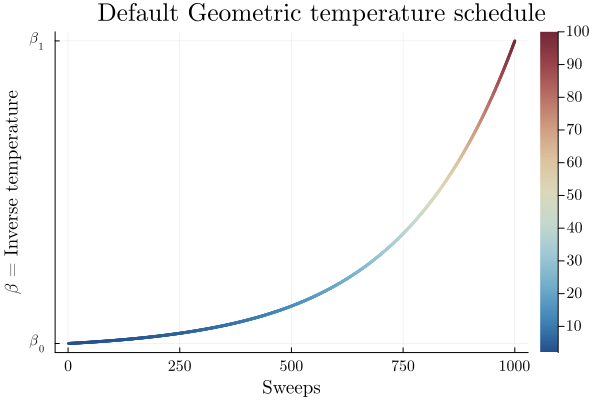

In [36]:
plot_schedule(β₀, β₁)

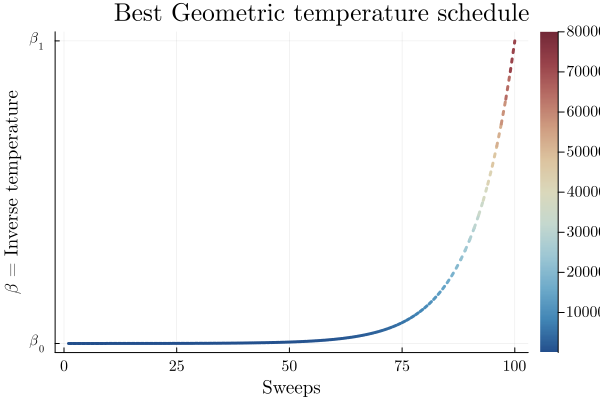

In [37]:
β₀, β₁ = (2.0, 80000.0)
plot_schedule(β₀, β₁; length=100, title="Best Geometric temperature schedule")

In [38]:
using StatsBase # For the 'percentile' function

Calculating optimal sweep...
Minimum TTS for 'geometric' schedule = 0.04358931155565531s at sweep = 69
Processing sweep 69 for schedule geometric...
Processing sweep 1000 for schedule geometric...


┌ Warning: Pickle file not found: /home/jvpcms/purdue-internship/QUBONotebooksFork/notebooks_jl/results/42_geometric_69.p. Re-running simulation.
└ @ Main In[39]:48


Processing sweep 10 for schedule geometric...


┌ Warning: Pickle file not found: /home/jvpcms/purdue-internship/QUBONotebooksFork/notebooks_jl/results/42_geometric_1000.p. Re-running simulation.
└ @ Main In[39]:48


Processing sweep 500 for schedule geometric...


┌ Warning: Pickle file not found: /home/jvpcms/purdue-internship/QUBONotebooksFork/notebooks_jl/results/42_geometric_10.p. Re-running simulation.
└ @ Main In[39]:48
┌ Warning: Pickle file not found: /home/jvpcms/purdue-internship/QUBONotebooksFork/notebooks_jl/results/42_geometric_500.p. Re-running simulation.
└ @ Main In[39]:48


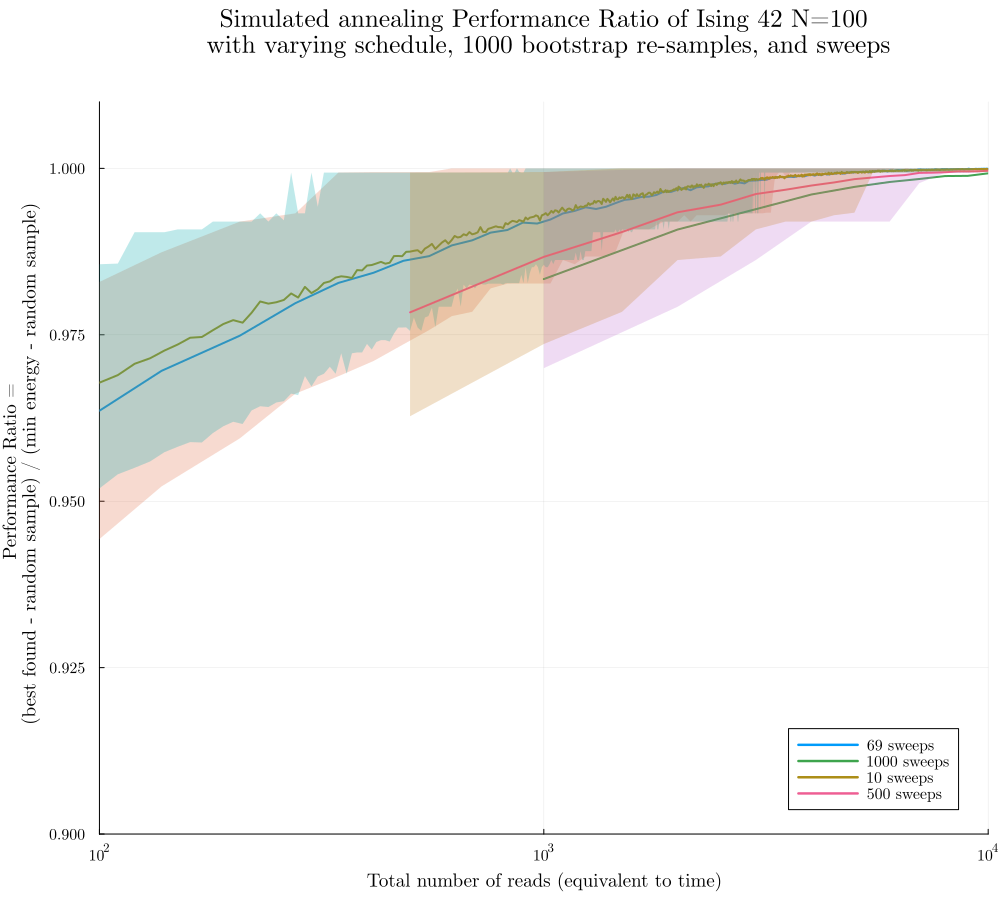

In [39]:
println("Calculating optimal sweep...")
local min_sweep

schedule_for_min_sweep = "geometric"

tts_data = results[:ttt][default_sweeps][schedule_for_min_sweep]

finite_tts_data = [
    (t isa Number && isfinite(t)) ? t : Inf 
    for t in tts_data
]

min_tts, min_index = findmin(finite_tts_data)

min_sweep = sweeps[min_index]

println("Minimum TTS for '$schedule_for_min_sweep' schedule = $(min_tts)s at sweep = $(min_sweep)")

interest_sweeps = [min_sweep, default_sweeps, 10, 500]

n_boot_plot = 1000 

schedules_for_plot = ["geometric"]

boot_range = 1:999

approx_ratio = Dict{String, Dict{Int, Vector{Float64}}}()
approx_ratioci = Dict{String, Dict{Int, Vector{Tuple{Float64, Float64}}}}()

p_approx = plot()

for schedule in schedules_for_plot
    approx_ratio[schedule] = Dict{Int, Vector{Float64}}()
    approx_ratioci[schedule] = Dict{Int, Vector{Tuple{Float64, Float64}}}()

    min_energy = results[:min_energy][schedule]
    random_energy = results[:random_energy][schedule]

    for sweep in interest_sweeps
        println("Processing sweep $sweep for schedule $schedule...")

        pickle_name = joinpath(pickle_path, "$(instance)_$(schedule)_$(sweep).p") # 

        local sol
        if isfile(pickle_name) && !overwrite_pickles
            sol = QUBOTools.read_solution(pickle_name) # 
        else
            @warn "Pickle file not found: $pickle_name. Re-running simulation."
            set_attribute(random_ising_model, "num_reads", total_reads)
            set_attribute(random_ising_model, "num_sweeps", sweep)
            set_attribute(random_ising_model, "beta_schedule_type", schedule)

            optimize!(random_ising_model)

            sol = QUBOTools.solution(unsafe_backend(random_ising_model)) # 
        end

        energies_unique = QUBOTools.value.(sol) # 
        occurrences = QUBOTools.reads.(sol) # 
        
        all_energies = vcat([fill(energies_unique[i], occurrences[i]) for i in 1:length(energies_unique)]...)

        current_min = minimum(all_energies)
        if current_min < min_energy
            @info("A better solution of '$(current_min)' was found for sweep '$sweep'")
            min_energy = current_min
        end

        b = Float64[]
        bcs = Tuple{Float64, Float64}[]

        for boot_size in boot_range
            boot_dist = Float64[]
            
            for _ in 1:n_boot_plot
                resampler = rand(1:length(all_energies), boot_size)
                sample_boot = all_energies[resampler]
                
                push!(boot_dist, minimum(sample_boot))
            end
            
            push!(b, mean(boot_dist))
            
            cilo = percentile(boot_dist, 50 - ci / 2) 
            ciup = percentile(boot_dist, 50 + ci / 2) 
            push!(bcs, (cilo, ciup))
        end

        approx_ratio[schedule][sweep] = [
            (random_energy - energy) / (random_energy - min_energy) for energy in b
        ]
        
        approx_ratioci[schedule][sweep] = [
            ((random_energy - ci_low) / (random_energy - min_energy), 
             (random_energy - ci_high) / (random_energy - min_energy))
            for (ci_low, ci_high) in bcs
        ]

        x_values = [shot * sweep for shot in boot_range]
        y_values = approx_ratio[schedule][sweep]
        
        ci_data = approx_ratioci[schedule][sweep]
        upper_bound_series = getindex.(ci_data, 1)
        lower_bound_series = getindex.(ci_data, 2)
        
        ribbon_low = y_values .- lower_bound_series
        ribbon_high = upper_bound_series .- y_values

        plot!(p_approx, x_values, y_values, 
              label="$sweep sweeps", 
              linewidth=2)
        
        plot!(p_approx, x_values, y_values;
              ribbon=(ribbon_low, ribbon_high),
              fillalpha=0.25,
              label="",
              linewidth=0)
    end
end

title_str = "Simulated annealing Performance Ratio of Ising 42 N=100\n with varying schedule, $n_boot_plot bootstrap re-samples, and sweeps"
ylabel_str = "Performance Ratio = \n (best found - random sample) / (min energy - random sample)"
xlabel_str = "Total number of reads (equivalent to time)"

plot!(p_approx,
    plot_title = title_str,
    size = (1000, 900),
    xlabel = xlabel_str,
    ylabel = ylabel_str,
    xscale = :log10,
    ylims = (0.9, 1.01),
    xlims = (1e2, 1e4),
    legend = :bottomright,
    
    plot_titlevspan = 0.1,
    plot_titlefont  = Plots.font(16, "Computer Modern"),
    guidefont       = Plots.font(12, "Computer Modern"),
    legendfont      = Plots.font(10, "Computer Modern"),
    tickfont        = Plots.font(10, "Computer Modern")
)

display(p_approx)

Here see how using the optimal number of sweeps is better than using other values (including the default recommended by the solver) in terms of solving this problem.
Obviously, we only know this after running the experiments and verifying it ourselves.
This is not the usual case, so we want to see how well can we do if we solve similar (but no the same instances).
Here we will generate 20 random instances from the same distribution and size but different random seed. 

In [40]:
println("Starting multi-instance analysis...")

# 1. Define constants for the multi-instance run
# (These are defined in the Python snippet)
instances = 0:19 # Python's range(20)
schedules_multi = ["geometric"] # The Python snippet only uses 'geometric'
# We use 'threshold', 'sweeps', 'total_reads', 'default_sweeps', 'n_boot', 'ci', 'boots'
# (as defined earlier in the script)

# Define the master results dictionary
all_results = Dict{Int, Any}()
all_results_name = joinpath(pickle_path, "all_results.json")

# 2. Always generate new data (as requested)
println("Generating new multi-instance results...")

for instance in instances
    println("--- Processing Instance $instance ---")
    
    # Initialize the dictionary for this specific instance
    all_results[instance] = Dict{Symbol, Any}(
        :p             => Dict{Int,Any}(),
        :min_energy    => Dict{String,Any}(),
        :random_energy => Dict{String,Any}(),
        :ttt           => Dict{Int,Any}(),
        :tttci         => Dict{Int,Any}(),
        :t             => Dict{String,Any}(),
        :best          => Dict{Int,Any}(),
        :bestci        => Dict{Int,Any}(),
    )

    # --- 3. Define the model for this instance ---
    Random.seed!(instance)
    
    # (Using the same random model definitions as the single-instance run)
    J_instance = triu!(2rand(Float64, n, n) .- 1, 1)
    h_instance = 2rand(Float64, n) .- 1
    
    instance_model = Model()
    @variable(instance_model, s_inst[1:n], Spin)
    @objective(instance_model, Min, s_inst' * J_instance * s_inst + h_instance' * s_inst)

    # --- 4. Get Random Energy for this instance ---
    set_optimizer(instance_model, QUBO.RandomSampler.Optimizer)
    set_attribute(instance_model, "num_reads", total_reads)
    optimize!(instance_model)
    
    instance_energies = [objective_value(instance_model; result = i) for i = 1:result_count(instance_model)]
    instance_random_energy = mean(instance_energies)

    # --- 5. Get Minimum Energy (from default SA run) ---
    default_sol_name = joinpath(pickle_path, "solutions_$(instance)_geometric_$(default_sweeps).json")

    local default_sol
    
    # --- Always re-run the default solution ---
    set_optimizer(instance_model, DWave.Neal.Optimizer)
    set_attribute(instance_model, "num_reads", total_reads)
    set_attribute(instance_model, "num_sweeps", default_sweeps)
    set_attribute(instance_model, "beta_schedule_type", "geometric")
    
    optimize!(instance_model)
    default_sol = QUBOTools.solution(unsafe_backend(instance_model))
    
    # Save the default solution file
    open(default_sol_name, "w") do io
        QUBOTools.write_solution(io, default_sol, QUBOTools.BQPJSON())
    end
    
    default_energies = QUBOTools.value.(default_sol)
    instance_min_energy = minimum(default_energies)
    
    # This will be updated as we loop
    current_min_energy = instance_min_energy

    # --- 6. Run Sweep/Schedule/Bootstrap Loop ---
    for schedule in schedules_multi
        # Initialize temporary arrays for this schedule
        probs       = Dict{Int,Any}(k => [] for k in boots)
        time_to_sol = Dict{Int,Any}(k => [] for k in boots)
        tttcs       = Dict{Int,Any}(k => [] for k in boots)
        times       = []
        b           = Dict{Int,Any}(k => [] for k in boots)
        bcs         = Dict{Int,Any}(k => [] for k in boots)

        println("Running schedule '$schedule' for instance $instance...")
        for sweep in sweeps
            # --- 6a. Load or Generate Data ---
            sol_filename = joinpath(pickle_path, "solutions_$(instance)_$(schedule)_$(sweep).json")

            local sol
            local time_s
            
            # --- Always re-run the simulation for each sweep ---
            set_optimizer(instance_model, DWave.Neal.Optimizer)
            set_attribute(instance_model, "num_reads", total_reads)
            set_attribute(instance_model, "num_sweeps", sweep)
            set_attribute(instance_model, "beta_schedule_type", schedule)

            optimize!(instance_model)

            sol = QUBOTools.solution(unsafe_backend(instance_model))
            time_s = QUBOTools.effective_time(sol)
            
            # Save the solution file
            open(sol_filename, "w") do io
                QUBOTools.write_solution(io, sol, QUBOTools.BQPJSON())
            end

            # --- 6b. Compute Statistics ---
            energies     = QUBOTools.value.(sol)
            occurrences  = QUBOTools.reads.(sol)
            
            push!(times, time_s)
            
            if minimum(energies) < current_min_energy
                current_min_energy = minimum(energies)
                @info("Instance $instance: New min energy '$(current_min_energy)' found for sweep '$sweep'")
            end

            # Define success relative to this instance's energies
            success = instance_random_energy - (instance_random_energy - current_min_energy)*(1.0 - threshold/100.0)

            # --- 6c. Bootstrap Loop ---
            
            # Create the expanded list of all energies (all 1000 reads)
            all_energies_expanded = vcat([fill(energies[i], occurrences[i]) for i in 1:length(energies)]...)

            for boot in boots
                boot_dist = Float64[] # Store min energies
                pr_dist   = Float64[] # Store success probabilities

                for i in 1:n_boot
                    # Sample `boot` items *with replacement* from `all_energies_expanded`
                    resampler = rand(1:length(all_energies_expanded), boot)
                    sample_boot = all_energies_expanded[resampler]
                    
                    # Find the minimum energy in this sample
                    push!(boot_dist, minimum(sample_boot))
                    
                    # Find the success probability in this sample
                    success_count = count(<(success), sample_boot)
                    push!(pr_dist, success_count / boot)
                end # end n_boot loop

                # --- 6d. Calculate TTT and Confidence Intervals ---
                push!(b[boot], mean(boot_dist))
                
                bnp_boot  = boot_dist
                cilo_boot = percentile(bnp_boot, 50 - ci / 2)
                ciup_boot = percentile(bnp_boot, 50 + ci / 2)
                push!(bcs[boot], (cilo_boot, ciup_boot))
                
                prob_np_boot = pr_dist
                pr_boot      = mean(prob_np_boot)
                if pr_boot >= 1
                    pr_boot = 1 - 1E-9
                end
                push!(probs[boot], pr_boot)

                if !all(x -> x > 0, prob_np_boot)
                    push!(time_to_sol[boot], Inf)
                    push!(tttcs[boot], (Inf, Inf))
                else
                    pr_cilo_boot = percentile(prob_np_boot, 50 - ci / 2)
                    if pr_cilo_boot >= 1
                        pr_cilo_boot = 1 - 1E-9
                    end
                    pr_ciup_boot = percentile(prob_np_boot, 50 + ci / 2)
                    if pr_ciup_boot >= 1
                        pr_ciup_boot = 1 - 1E-9
                    end
                    
                    try
                        push!(time_to_sol[boot], time_s * log10(1-s) / log10(1 - pr_boot + 1E-9))
                        push!(
                             tttcs[boot],
                            (
                                time_s*log10(1-s)/log10(1 - pr_cilo_boot + 1E-9), # Add 1E-9
                                time_s*log10(1-s)/log10(1 - pr_ciup_boot + 1E-9)  # Add 1E-9
                            )
                        )
                    catch e
                        @warn "Error in TTT calculation for instance $instance, sweep $sweep: $e"
                        push!(time_to_sol[boot], Inf)
                        push!(tttcs[boot], (Inf, Inf))
                    end
                end
            end # end boot in boots
        end # end sweep in sweeps

        # --- 7. Store results for this instance/schedule ---
        all_results[instance][:t][schedule]             = times
        all_results[instance][:min_energy][schedule]    = current_min_energy
        all_results[instance][:random_energy][schedule] = instance_random_energy

        for boot in boots
            # if key not in all_results[instance][:p], add it
            if !haskey(all_results[instance][:p], boot)
                all_results[instance][:p][boot] = Dict{String, Any}()
            end
            println(keys(all_results[instance][:p]))
            println(all_results[instance][:p])

            all_results[instance][:p][boot][schedule] = probs[boot]

            # if key not in all_results[instance][:ttt], add it
            if !haskey(all_results[instance][:ttt], boot)
                all_results[instance][:ttt][boot] = Dict{String, Any}()
            end
            all_results[instance][:ttt][boot][schedule]   = time_to_sol[boot]

            # if key not in all_results[instance][:tttci], add it
            if !haskey(all_results[instance][:tttci], boot)
                all_results[instance][:tttci][boot] = Dict{String, Any}()
            end
            all_results[instance][:tttci][boot][schedule] = tttcs[boot]

            # if key not in all_results[instance][:best], add it
            if !haskey(all_results[instance][:best], boot)
                all_results[instance][:best][boot] = Dict{String, Any}()
            end
            all_results[instance][:best][boot][schedule]  = [
                (instance_random_energy - energy) / (instance_random_energy - current_min_energy)
                for energy in b[boot]
            ]

            # if key not in all_results[instance][:bestci], add it
            if !haskey(all_results[instance][:bestci], boot)
                all_results[instance][:bestci][boot] = Dict{String, Any}()
            end
            all_results[instance][:bestci][boot][schedule] = [
                tuple(((instance_random_energy - element) / (instance_random_energy - current_min_energy) for element in energy)...)
                for energy in bcs[boot]
            ]
        end
    end # end schedule in schedules_multi
end # end instance in instances

# --- 8. Save all_results to JSON ---
println("Saving multi-instance results to $all_results_name...")
open(all_results_name, "w") do io
    JSON.print(io, all_results)
end
println("Save complete.")

println("Multi-instance analysis script finished.")

Starting multi-instance analysis...
Generating new multi-instance results...
--- Processing Instance 0 ---
Running schedule 'geometric' for instance 0...
[1]
Dict{Int64, Any}(1 => Dict{String, Any}())
[10, 1]
Dict{Int64, Any}(10 => Dict{String, Any}(), 1 => Dict{String, Any}("geometric" => Any[0.0, 0.0, 0.002, 0.03, 0.102, 0.102, 0.158, 0.162, 0.188, 0.192, 0.218, 0.194, 0.224, 0.29, 0.27, 0.236, 0.308, 0.27, 0.296, 0.27, 0.316, 0.312, 0.38, 0.344, 0.326, 0.352, 0.358, 0.378, 0.392, 0.436, 0.374, 0.37, 0.38, 0.378, 0.458, 0.436, 0.44, 0.456, 0.438, 0.414, 0.48, 0.474, 0.47, 0.51, 0.47, 0.476, 0.528, 0.502, 0.52, 0.524, 0.518, 0.5, 0.538, 0.564, 0.578, 0.596, 0.596, 0.556, 0.576, 0.536, 0.604, 0.584, 0.58, 0.604, 0.656, 0.62, 0.608, 0.68, 0.642, 0.638, 0.642, 0.608, 0.648, 0.618, 0.616, 0.668, 0.692, 0.652, 0.644, 0.702, 0.644, 0.704, 0.664, 0.664, 0.654, 0.642, 0.692, 0.642, 0.678, 0.702, 0.766, 0.674, 0.694, 0.7, 0.734, 0.724, 0.672, 0.692, 0.724, 0.752, 0.72, 0.678, 0.748, 0.76, 0.68

In [41]:
# zip the results folder
zip(pickle_path, pickle_path * ".zip")

zip("/home/jvpcms/purdue-internship/QUBONotebooksFork/notebooks_jl/results", "/home/jvpcms/purdue-internship/QUBONotebooksFork/notebooks_jl/results.zip")

In [42]:
"""
Calculates the median of an array, skipping NaN values.
`dims=1` calculates the median for each column (across instances).
`dims=2` calculates the median for each row (across sweeps).
"""
function nanmedian(A; dims)
    return mapslices(A, dims=dims) do v
        filtered_v = filter(!isnan, v)
        return isempty(filtered_v) ? NaN : median(filtered_v)
    end
end

"""
Calculates the standard deviation of an array, skipping NaN values.
"""
function nanstd(A; dims)
    return mapslices(A, dims=dims) do v
        filtered_v = filter(!isnan, v)
        return isempty(filtered_v) ? NaN : std(filtered_v)
    end
end

"""
Performs bootstrapping to find the confidence interval of the median.
"""
function bootstrap(data; n_boot=1000, ci=68)
    boot_dist = []
    
    n_instances = size(data, 1) # Number of rows (instances)
    
    for i in 1:n_boot
        resampler_idx = rand(1:n_instances, n_instances)
        sample = data[resampler_idx, :]
        
        push!(boot_dist, nanmedian(sample, dims=1))
    end
    
    b = vcat(boot_dist...)
    
    s1 = mapslices(b, dims=1) do v
        filtered_v = filter(!isnan, v)
        return isempty(filtered_v) ? NaN : percentile(filtered_v, 50.0 - ci/2.0)
    end
    
    s2 = mapslices(b, dims=1) do v
        filtered_v = filter(!isnan, v)
        return isempty(filtered_v) ? NaN : percentile(filtered_v, 50.0 + ci/2.0)
    end
    
    return (s1, s2)
end

"""
Plots a time series (median) with a shaded confidence interval (ribbon).
"""
function tsplotboot!(plt, x, data, error_est; label="", kwargs...)
    est = nanmedian(data, dims=1)[1,:]
    
    mask = .!isnan.(est)
    x_masked = x[mask]
    est_masked = est[mask]

    local ci_low, ci_high
    if error_est == "bootstrap"
        cis = bootstrap(data)
        ci_low = cis[1][1,:][mask] # [1,:] to get 1D Vector
        ci_high = cis[2][1,:][mask]
    elseif error_est == "std"
        sd = nanstd(data, dims=1)[1,:][mask]
        ci_low = est_masked .- sd
        ci_high = est_masked .+ sd
    end
    
    ribbon_low = est_masked .- ci_low
    ribbon_high = ci_high .- est_masked
    
    plot!(plt, x_masked, est_masked; 
          ribbon=(ribbon_low, ribbon_high), 
          fillalpha=0.35, 
          label=label, 
          kwargs...)
end

tsplotboot!

Now we bootstrap our solutions with respect to the whole set of isntances, or ensemble, and we use the median which respresents the solution better than the mean.

┌ Warning: Unused origin arg in bbox construction: relative
└ @ Plots ~/.julia/packages/Plots/8ZnR3/src/layouts.jl:88


minimum median TTS for geometric schedule = NaN s at sweep = 1
minimum TTS for instance 42 with geometric schedule = NaN s at sweep = 1


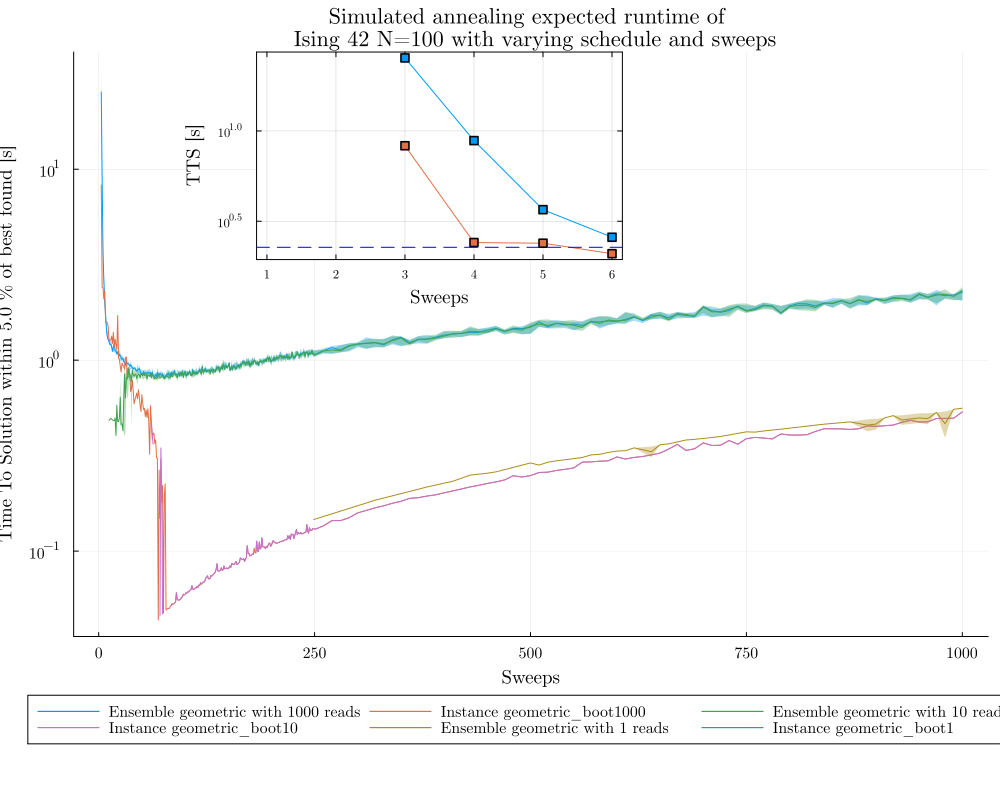

In [43]:
plt = plot(
    size = (1000, 800),
    title = "Simulated annealing expected runtime of \n Ising 42 N=100 with varying schedule and sweeps",
    yscale = :log10,
    ylabel = "Time To Solution within $threshold % of best found [s]",
    xlabel = "Sweeps",
    legend = :outerbottom,
    legend_columns = 3
)

schedules_to_plot = ["geometric"] 

for boot in reverse(boots)
    for schedule in schedules_to_plot
        
        data_list = []
        for i in instances # instances = 0:19
            raw_vec = all_results[i][:ttt][boot][schedule]
            clean_vec = [v isa Number ? (isfinite(v) ? v : NaN) : NaN for v in raw_vec]
            push!(data_list, transpose(clean_vec)) # Transpose to a 1xN row vector
        end
        results_array = vcat(data_list...)
        
        tsplotboot!(plt, sweeps, results_array, "bootstrap"; 
                    label="Ensemble $schedule with $boot reads")

        raw_vec_42 = results[:ttt][boot][schedule]
        clean_vec_42 = [v isa Number ? (isfinite(v) ? v : NaN) : NaN for v in raw_vec_42]
        
        
        plot!(plt, sweeps, clean_vec_42; 
              label="Instance $(schedule)_boot$boot")
    end
end

plot!(plt, 
    inset = (1, bbox(0.2, 0.0, 0.4, 0.3, :relative)),
    subplot = 2,
    yscale = :log10,
    ylabel = "TTS [s]",
    xlabel = "Sweeps",
    framestyle = :box,
    legend = false,
    tickfont = Plots.font(8, "Computer Modern") # Smaller font for inset
)

for schedule in schedules_to_plot
    data_list_inset = []
    for i in instances
        raw_vec = all_results[i][:ttt][default_sweeps][schedule]
        clean_vec = [v isa Number ? (isfinite(v) ? v : NaN) : NaN for v in raw_vec]
        push!(data_list_inset, transpose(clean_vec))
    end
    results_array_inset = vcat(data_list_inset...)
    
    median_tts_inset = nanmedian(results_array_inset, dims=1)[1,:]
    
    min_median_tts_val, min_median_index = findmin(median_tts_inset)
    min_median_sweep = sweeps[min_median_index]
    
    raw_vec_42_inset = results[:ttt][default_sweeps][schedule]
    clean_vec_42_inset = [v isa Number ? (isfinite(v) ? v : NaN) : NaN for v in raw_vec_42_inset]
    
    min_tts_42_val, min_index_42 = findmin(clean_vec_42_inset)
    min_sweep_42 = sweeps[min_index_42]
    
    index_lo, index_hi = sort([min_index_42, min_median_index])
    pad = 5
    range_lo = max(1, index_lo - pad)
    range_hi = min(length(sweeps), index_hi + pad)
    plot_range = range_lo:range_hi
    
    println("minimum median TTS for $schedule schedule = $min_median_tts_val s at sweep = $min_median_sweep")
    println("minimum TTS for instance 42 with $schedule schedule = $min_tts_42_val s at sweep = $min_sweep_42")

    plot!(plt[2], sweeps[plot_range], median_tts_inset[plot_range], 
          linestyle=:solid, marker=:square, label="")
          
    plot!(plt[2], sweeps[plot_range], clean_vec_42_inset[plot_range], 
          linestyle=:solid, marker=:square, label="")
          
    default_vals = [
        let v = all_results[i][:ttt][default_sweeps][schedule][end]
            v isa Number ? (isfinite(v) ? v : NaN) : NaN
        end 
        for i in instances
    ]
    median_default = nanmedian(default_vals, dims=1)[1]
    
    hline!(plt[2], [median_default], 
           linestyle=:dash, color=:blue, label="")
end

display(plt)

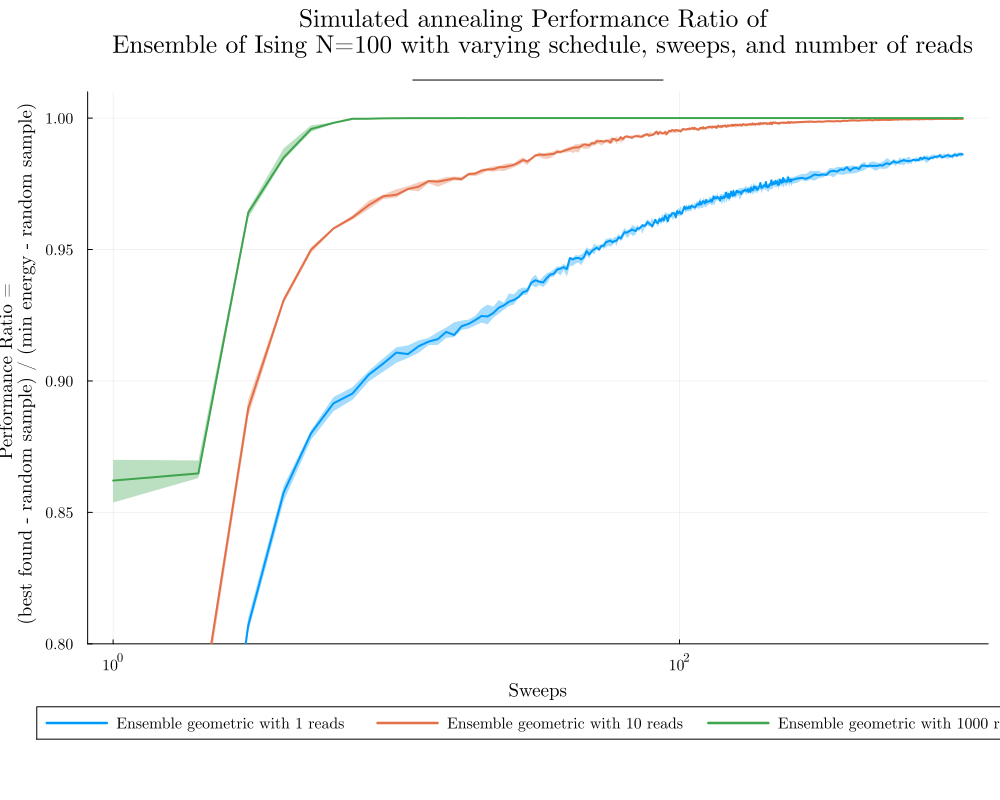

┌ Warning: No strict ticks found
└ @ PlotUtils ~/.julia/packages/PlotUtils/dVEMd/src/ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils ~/.julia/packages/PlotUtils/dVEMd/src/ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils ~/.julia/packages/PlotUtils/dVEMd/src/ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils ~/.julia/packages/PlotUtils/dVEMd/src/ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils ~/.julia/packages/PlotUtils/dVEMd/src/ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils ~/.julia/packages/PlotUtils/dVEMd/src/ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils ~/.julia/packages/PlotUtils/dVEMd/src/ticks.jl:194


In [44]:
plt_approx = plot(
    size = (1000, 800),
    plot_title = "Simulated annealing Performance Ratio of \n Ensemble of Ising N=100 with varying schedule, sweeps, and number of reads",
    xlabel = "Sweeps",
    ylabel = "Performance Ratio = \n (best found - random sample) / (min energy - random sample)",
    xscale = :log10,
    ylims = (0.8, 1.01),
    
    legend = :outerbottom,
    legend_columns = 3,
    plot_titlevspan = 0.1,
    plot_titlefont  = Plots.font(16, "Computer Modern"),
    guidefont       = Plots.font(12, "Computer Modern"),
    legendfont      = Plots.font(10, "Computer Modern"),
    tickfont        = Plots.font(10, "Computer Modern")
)

schedules_to_plot = ["geometric"] 

for boot in boots # `boots` should be defined from your main script
    for schedule in schedules_to_plot
        
        data_list = []
        for i in instances # instances = 0:19
            raw_vec = all_results[i][:best][boot][schedule]
            
            clean_vec = [v isa Number ? (isfinite(v) ? v : NaN) : NaN for v in raw_vec]
            push!(data_list, transpose(clean_vec)) # Transpose to a 1xN row vector
        end
        best_array = vcat(data_list...)
        
        tsplotboot!(plt_approx, sweeps, best_array, "bootstrap"; 
                    label="Ensemble $schedule with $boot reads",
                    linewidth=2)
    end
end

display(plt_approx)

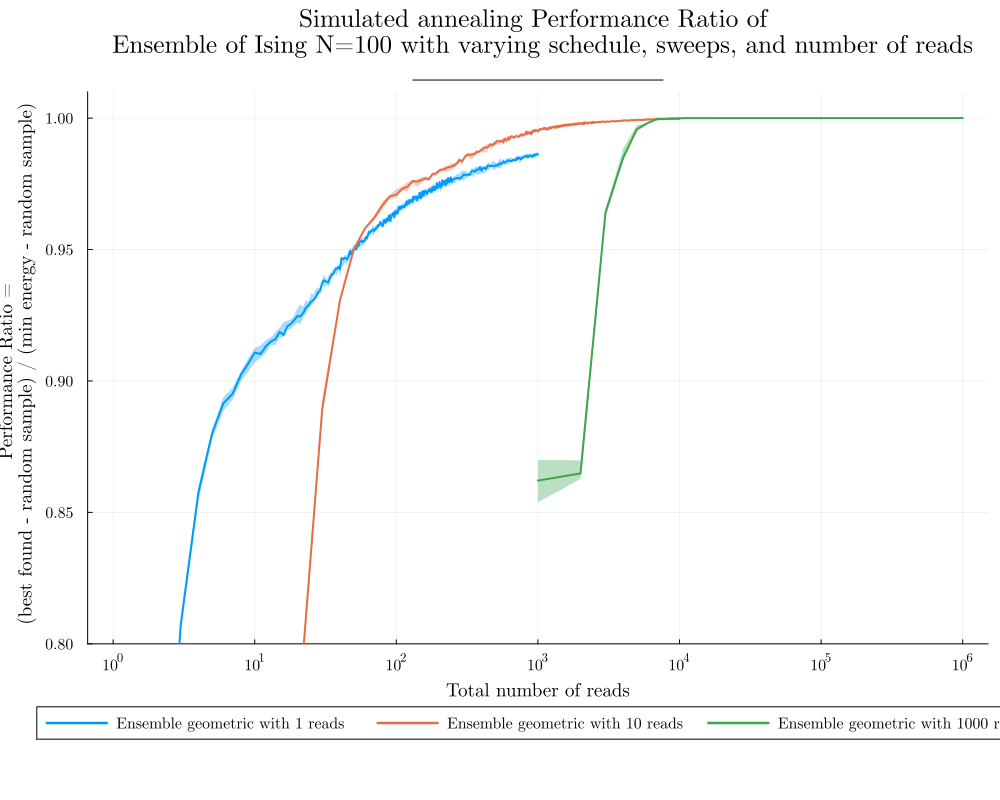

┌ Warning: No strict ticks found
└ @ PlotUtils ~/.julia/packages/PlotUtils/dVEMd/src/ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils ~/.julia/packages/PlotUtils/dVEMd/src/ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils ~/.julia/packages/PlotUtils/dVEMd/src/ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils ~/.julia/packages/PlotUtils/dVEMd/src/ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils ~/.julia/packages/PlotUtils/dVEMd/src/ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils ~/.julia/packages/PlotUtils/dVEMd/src/ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils ~/.julia/packages/PlotUtils/dVEMd/src/ticks.jl:194


In [45]:
plt_total_reads = plot(
    size = (1000, 800),
    plot_title = "Simulated annealing Performance Ratio of \n Ensemble of Ising N=100 with varying schedule, sweeps, and number of reads",
    xlabel = "Total number of reads",
    ylabel = "Performance Ratio = \n (best found - random sample) / (min energy - random sample)", # Using the full label
    xscale = :log10,
    ylims = (0.8, 1.01),
    
    legend = :outerbottom, # Changed from Python to place it neatly at the bottom
    legend_columns = 3,
    plot_titlevspan = 0.1,
    plot_titlefont  = Plots.font(16, "Computer Modern"),
    guidefont       = Plots.font(12, "Computer Modern"),
    legendfont      = Plots.font(10, "Computer Modern"),
    tickfont        = Plots.font(10, "Computer Modern")
)

schedules_to_plot = ["geometric"] 

for boot in boots # `boots` should be defined from your main script
    reads = [s * boot for s in sweeps]
    
    for schedule in schedules_to_plot
        
        data_list = []
        for i in instances # instances = 0:19
            raw_vec = all_results[i][:best][boot][schedule]
            
            clean_vec = [v isa Number ? (isfinite(v) ? v : NaN) : NaN for v in raw_vec]
            push!(data_list, transpose(clean_vec)) # Transpose to a 1xN row vector
        end
        best_array = vcat(data_list...)
        
        tsplotboot!(plt_total_reads, reads, best_array, "bootstrap"; 
                    label="Ensemble $schedule with $boot reads",
                    linewidth=2)
    end
end

display(plt_total_reads)

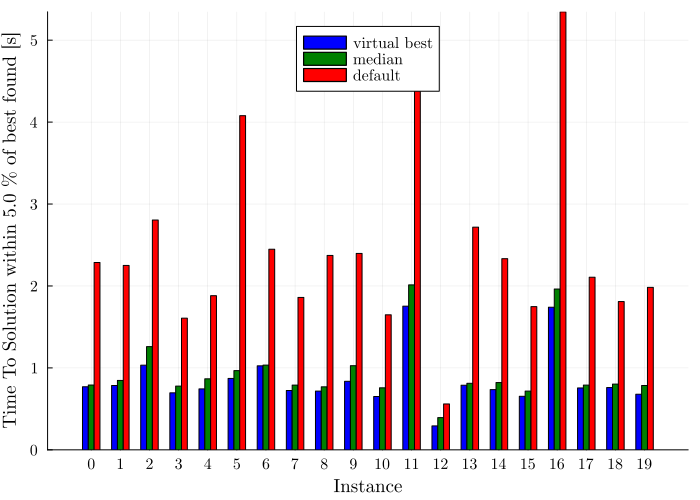

In [46]:
"""
Cleans a vector for use with `minimum` or `argmin`.
Replaces `nothing`, `NaN`, and `Inf` with `Inf`.
"""
function clean_vec_for_min(raw_vec)
    return [
        (v isa Number && isfinite(v)) ? v : Inf 
        for v in raw_vec
    ]
end

"""
Cleans a single value for plotting.
Replaces `nothing`, `NaN`, or `Inf` with `NaN` so it doesn't plot.
"""
function clean_val_for_plot(val)
    return (val isa Number && isfinite(val)) ? val : NaN
end


data_list_inset = []
for i in instances
    raw_vec = all_results[i][:ttt][default_sweeps]["geometric"]
    clean_vec = [v isa Number ? (isfinite(v) ? v : NaN) : NaN for v in raw_vec]
    push!(data_list_inset, transpose(clean_vec))
end
results_array_inset = vcat(data_list_inset...)
median_tts_inset = nanmedian(results_array_inset, dims=1)[1,:]
min_median_val, min_median_index = findmin(clean_vec_for_min(median_tts_inset))


raw_tts_vectors = [all_results[i][:ttt][default_sweeps]["geometric"] for i in instances]

cleaned_tts_vectors = [clean_vec_for_min(v) for v in raw_tts_vectors]

minima = [minimum(v) for v in cleaned_tts_vectors]

median_all = [clean_val_for_plot(v[min_median_index]) for v in raw_tts_vectors]

default = [clean_val_for_plot(v[end]) for v in raw_tts_vectors]

plt_bar = plot(
    size = (700, 500),
    xlabel = "Instance",
    ylabel = "Time To Solution within $threshold % of best found [s]",
    legend = :top,
    
    plot_titlefont  = Plots.font(16, "Computer Modern"),
    guidefont       = Plots.font(12, "Computer Modern"),
    legendfont      = Plots.font(10, "Computer Modern"),
    tickfont        = Plots.font(10, "Computer Modern")
)

bar!(plt_bar, instances .- 0.2, minima, 
     bar_width=0.2, label="virtual best", color=:blue)
     
bar!(plt_bar, instances, median_all, 
     bar_width=0.2, label="median", color=:green)
     
bar!(plt_bar, instances .+ 0.2, default, 
     bar_width=0.2, label="default", color=:red)

plot!(plt_bar, xticks = instances)

display(plt_bar)

Notice how much performance would we be losing if we had used the default value for all these instances, and how much we could eventually win if we knew the best for each.

Calculating optimal sweep for instance 42...
Minimum TTS for instance 42 = 0.04358931155565531s at sweep = 69
Minimum MEDIAN TTS (all instances) at sweep = 77
Processing sweep 69 for schedule geometric...
Processing sweep 1000 for schedule geometric...


┌ Warning: Solution file not found: /home/jvpcms/purdue-internship/QUBONotebooksFork/notebooks_jl/results/solutions_42_geometric_69.json. Re-running simulation.
└ @ Main In[47]:45


Processing sweep 10 for schedule geometric...


┌ Warning: Solution file not found: /home/jvpcms/purdue-internship/QUBONotebooksFork/notebooks_jl/results/solutions_42_geometric_1000.json. Re-running simulation.
└ @ Main In[47]:45


Processing sweep 500 for schedule geometric...


┌ Warning: Solution file not found: /home/jvpcms/purdue-internship/QUBONotebooksFork/notebooks_jl/results/solutions_42_geometric_10.json. Re-running simulation.
└ @ Main In[47]:45


Processing sweep 77 for schedule geometric...


┌ Warning: Solution file not found: /home/jvpcms/purdue-internship/QUBONotebooksFork/notebooks_jl/results/solutions_42_geometric_500.json. Re-running simulation.
└ @ Main In[47]:45
┌ Warning: Solution file not found: /home/jvpcms/purdue-internship/QUBONotebooksFork/notebooks_jl/results/solutions_42_geometric_77.json. Re-running simulation.
└ @ Main In[47]:45


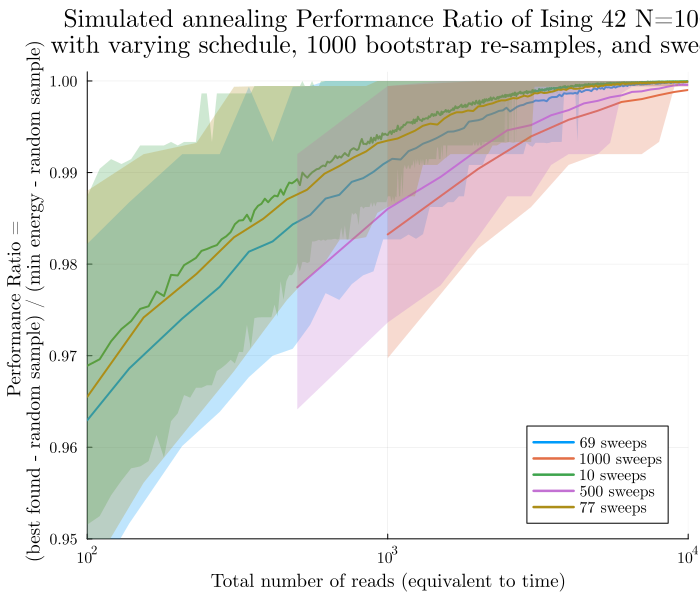

In [47]:
println("Calculating optimal sweep for instance 42...")
local min_sweep
tts_data_42 = results[:ttt][default_sweeps]["geometric"]
finite_tts_data_42 = [
    (t isa Number && isfinite(t)) ? t : Inf 
    for t in tts_data_42
]
min_tts_42, min_index_42 = findmin(finite_tts_data_42)
min_sweep = sweeps[min_index_42]

min_median_sweep = sweeps[min_median_index]

println("Minimum TTS for instance 42 = $(min_tts_42)s at sweep = $(min_sweep)")
println("Minimum MEDIAN TTS (all instances) at sweep = $(min_median_sweep)")

interest_sweeps = [min_sweep, default_sweeps, 10, 500, min_median_sweep]
interest_sweeps = unique(interest_sweeps)

n_boot_plot = 1000
schedules_for_plot = ["geometric"]
boot_range = 1:999
ci = 68

approx_ratio = Dict{String, Dict{Int, Vector{Float64}}}()
approx_ratioci = Dict{String, Dict{Int, Vector{Tuple{Float64, Float64}}}}()

p_approx = plot()

for schedule in schedules_for_plot
    approx_ratio[schedule] = Dict{Int, Vector{Float64}}()
    approx_ratioci[schedule] = Dict{Int, Vector{Tuple{Float64, Float64}}}()

    min_energy = results[:min_energy][schedule]
    random_energy = results[:random_energy][schedule]

    for sweep in interest_sweeps
        println("Processing sweep $sweep for schedule $schedule...")

        sol_filename = joinpath(pickle_path, "solutions_$(instance)_$(schedule)_$(sweep).json")
        
        local sol
        if isfile(sol_filename) && !overwrite_pickles
            sol = QUBOTools.read_solution(sol_filename)
        else
            @warn "Solution file not found: $sol_filename. Re-running simulation."
            set_optimizer(random_ising_model, DWave.Neal.Optimizer)
            set_attribute(random_ising_model, "num_reads", total_reads)
            set_attribute(random_ising_model, "num_sweeps", sweep)
            set_attribute(random_ising_model, "beta_schedule_type", schedule)

            optimize!(random_ising_model)
            sol = QUBOTools.solution(unsafe_backend(random_ising_model))
            
            open(sol_filename, "w") do io
                QUBOTools.write_solution(io, sol, QUBOTools.BQPJSON())
            end
        end

        energies_unique = QUBOTools.value.(sol)
        occurrences = QUBOTools.reads.(sol)
        
        all_energies = vcat([fill(energies_unique[i], occurrences[i]) for i in 1:length(energies_unique)]...)

        current_min = isempty(all_energies) ? Inf : minimum(all_energies)
        if current_min < min_energy
            @info("A better solution of '$(current_min)' was found for sweep '$sweep'")
            min_energy = current_min
        end

        b = Float64[]
        bcs = Tuple{Float64, Float64}[]

        for boot_size in boot_range
            shot_dist = Float64[] # Python's 'shot_dist'
            
            for _ in 1:n_boot_plot
                resampler = rand(1:length(all_energies), boot_size)
                sample_boot = all_energies[resampler]
                
                push!(shot_dist, minimum(sample_boot))
            end
            
            push!(b, mean(shot_dist))
            
            bnp = filter(!isnan, shot_dist)
            if isempty(bnp)
                push!(bcs, (NaN, NaN))
            else
                cilo = percentile(bnp, 50 - ci / 2)
                ciup = percentile(bnp, 50 + ci / 2)
                push!(bcs, (cilo, ciup))
            end
        end

        approx_ratio[schedule][sweep] = [
            (random_energy - energy) / (random_energy - min_energy) for energy in b
        ]
        
        approx_ratioci[schedule][sweep] = [
            (
                (random_energy - ci_low) / (random_energy - min_energy), 
                (random_energy - ci_high) / (random_energy - min_energy)
            )
            for (ci_low, ci_high) in bcs
        ]

        x_values = [shot * sweep for shot in boot_range]
        y_values = approx_ratio[schedule][sweep]
        
        ci_data = approx_ratioci[schedule][sweep]
        upper_bound_series = getindex.(ci_data, 1)
        lower_bound_series = getindex.(ci_data, 2)
        
        ribbon_low = y_values .- lower_bound_series
        ribbon_high = upper_bound_series .- y_values

        plot!(p_approx, x_values, y_values, 
              label="$sweep sweeps", 
              linewidth=2,
              ribbon=(ribbon_low, ribbon_high),
              fillalpha=0.25)
    end
end


title_str = "Simulated annealing Performance Ratio of Ising 42 N=100\n with varying schedule, $n_boot_plot bootstrap re-samples, and sweeps"
ylabel_str = "Performance Ratio = \n (best found - random sample) / (min energy - random sample)"
xlabel_str = "Total number of reads (equivalent to time)"

plot!(p_approx,
    plot_title = title_str,
    xlabel = xlabel_str,
    ylabel = ylabel_str,
    xscale = :log10,
    ylims = (0.95, 1.001),
    xlims = (1e2, 1e4),
    legend = :best,
    
    size = (700, 600),
    plot_titlevspan = 0.1,
    plot_titlefont  = Plots.font(16, "Computer Modern"),
    guidefont       = Plots.font(12, "Computer Modern"),
    legendfont      = Plots.font(10, "Computer Modern"),
    tickfont        = Plots.font(10, "Computer Modern")
)

display(p_approx)

This example shows that for our beloved instance 42, using the mean of the best accross the ensemble is better than using the default, but not as good as if we knew from scratch what would have made the best case.

After figuring out what would be the best parameter for our instance of interest, it would be nice to see what the ensemble performance is.
We have several choices, either going with the (arbitrary) default values, or using the mean of the best performance we have found up to that point.
There is an unachievable goal, which would be the case where we knew the best solution of each case, which we call the virtual best.
This helps us understand how much is at stake with the choice of parameters we make.

In [48]:
n_boot_plot = 100
schedules_for_plot = ["geometric"]
boot_range = 1:999
ci = 68
overwrite_pickles = false

indices = Int[]
for i in instances
    raw_vec = all_results[i][:ttt][default_sweeps]["geometric"]
    push!(indices, argmin(clean_vec_for_min(raw_vec)))
end

min_median_sweep = sweeps[min_median_index]
interest_sweeps_keys = [string(min_median_sweep), string(default_sweeps), "best"]

all_approx_ratio = Dict{Int, Dict{String, Dict{String, Any}}}()
for instance in instances
    all_approx_ratio[instance] = Dict{String, Dict{String, Any}}()
    for schedule in schedules_for_plot
        all_approx_ratio[instance][schedule] = Dict{String, Any}()
    end
end

plt_final = plot(
    size = (700, 600),
    title = "Simulated annealing Performance Ratio of Ising Ensemble N=100\n with varying schedule, $n_boot_plot bootstrap re-samples, and sweeps",
    xlabel = "Total number of reads (equivalent to time)",
    ylabel = "Performance Ratio = \n (best found - random sample) / (min energy - random sample)",
    xscale = :log10,
    ylims = (0.95, 1.001),
    xlims = (1e2, 1e4),
    
    legend = :best,
    plot_titlevspan = 0.1,
    plot_titlefont  = Plots.font(16, "Computer Modern"),
    guidefont       = Plots.font(12, "Computer Modern"),
    legendfont      = Plots.font(10, "Computer Modern"),
    tickfont        = Plots.font(10, "Computer Modern")
)

for instance in instances
    println("Processing instance $instance...")

    Random.seed!(instance)
    J_instance = triu!(2rand(Float64, n, n) .- 1, 1)
    h_instance = 2rand(Float64, n) .- 1
    
    instance_model = Model()
    @variable(instance_model, s_inst[1:n], Spin)
    @objective(instance_model, Min, s_inst' * J_instance * s_inst + h_instance' * s_inst)
    set_optimizer(instance_model, DWave.Neal.Optimizer)

    for sweep_key in interest_sweeps_keys
        flag_best = false
        current_sweep = 0

        if sweep_key == "best"
            flag_best = true
            current_sweep = sweeps[indices[instance + 1]]
        else
            current_sweep = parse(Int, sweep_key)
        end

        schedule = "geometric"
        
        min_energy = all_results[instance][:min_energy]["geometric"]
        random_energy = all_results[instance][:random_energy]["geometric"]

        sol_filename = joinpath(pickle_path, "solutions_$(instance)_$(schedule)_$(current_sweep).json")
        
        local sol
        set_attribute(instance_model, "num_reads", total_reads)
        set_attribute(instance_model, "num_sweeps", current_sweep)
        set_attribute(instance_model, "beta_schedule_type", schedule)

        optimize!(instance_model)
        sol = QUBOTools.solution(unsafe_backend(instance_model))
        
        open(sol_filename, "w") do io
            QUBOTools.write_solution(io, sol, QUBOTools.BQPJSON())
        end

        energies_unique = QUBOTools.value.(sol)
        occurrences = QUBOTools.reads.(sol)
        all_energies = vcat([fill(energies_unique[i], occurrences[i]) for i in 1:length(energies_unique)]...)

        current_min = isempty(all_energies) ? Inf : minimum(all_energies)
        if current_min < min_energy
            min_energy = current_min
        end

        b = Float64[]
        
        for boot_size in boot_range
            shot_dist = Float64[]
            n_inner_loops = n_boot_plot - boot_size + 1
            
            for i in 1:n_inner_loops
                resampler = rand(1:length(all_energies), boot_size)
                sample_boot = all_energies[resampler]
                push!(shot_dist, minimum(sample_boot))
            end
            
            push!(b, isempty(shot_dist) ? NaN : mean(shot_dist))
        end
        
        approx_ratios_vec = [(random_energy - energy) / (random_energy - min_energy) for energy in b]
        plot_key = flag_best ? "best" : sweep_key
        all_approx_ratio[instance][schedule][plot_key] = approx_ratios_vec

        x_values = [shot * current_sweep for shot in boot_range]
        alpha_val = flag_best ? 0.5 : 0.25
        plot!(plt_final, x_values, approx_ratios_vec, 
              color=:lightgray, label="", alpha=alpha_val, linewidth=0.5)
              
    end
end


Processing instance 0...
Processing instance 1...
Processing instance 2...
Processing instance 3...
Processing instance 4...
Processing instance 5...
Processing instance 6...
Processing instance 7...
Processing instance 8...
Processing instance 9...
Processing instance 10...
Processing instance 11...
Processing instance 12...
Processing instance 13...
Processing instance 14...
Processing instance 15...
Processing instance 16...
Processing instance 17...
Processing instance 18...
Processing instance 19...


Plotting ensemble data...


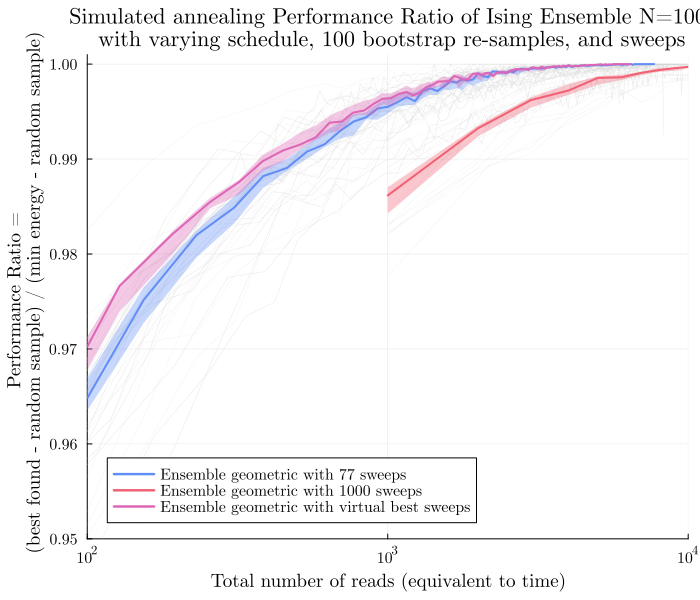

In [49]:
println("Plotting ensemble data...")
for sweep_key in interest_sweeps_keys
    schedule = "geometric"

    approx_ratio_array = vcat([
        transpose(all_approx_ratio[i][schedule][sweep_key]) 
        for i in instances
    ]...)

    label_plot = ""
    current_sweep_for_x = 0

    if sweep_key == "best"
        label_plot = "Ensemble $schedule with virtual best sweeps"
        current_sweep_for_x = sweeps[indices[end]] 
    else
        current_sweep_for_x = parse(Int, sweep_key)
        label_plot = "Ensemble $schedule with $sweep_key sweeps"
    end

    reads = [shot * current_sweep_for_x for shot in boot_range]
    
    tsplotboot!(plt_final, reads, approx_ratio_array, "bootstrap"; 
                label=label_plot, linewidth=2)
end

display(plt_final)

As you can see, there is a gap between the case with the best mean performance and the virtual best. This difference is arguably small, but you can imagine that with a larger number of parameters, this difference can become larger and larger, making the search of good parameters more worthy and complicated. We are actively working on such parameter setting strategies, and expect to make progress in this area (keep tuned!).